## Image classification with Convolutional Neural Networks for Myntra T-Shirts

Welcome to the first week of the second deep learning certificate! We're going to use convolutional neural networks (CNNs) to allow our computer to see - something that is only possible thanks to deep learning.

## Introduction to our first task: 'Dogs vs Cats'

We're going to try to create a model to enter the Dogs vs Cats competition at Kaggle. There are 25,000 labelled dog and cat photos available for training, and 12,500 in the test set that we have to try to label for this competition. According to the Kaggle web-site, when this competition was launched (end of 2013): "State of the art: The current literature suggests machine classifiers can score above 80% accuracy on this task". So if we can beat 80%, then we will be at the cutting edge as of 2013!

In [11]:
# Put these at the top of every notebook, to get automatic reloading and inline plotting
%reload_ext autoreload
%autoreload 2
%matplotlib inline

Here we import the libraries we need. We'll learn about what each does during the course.

In [12]:
# This file contains all the main external libs we'll use
from fastai.imports import *

In [13]:
from fastai.transforms import *
from fastai.conv_learner import *
from fastai.model import *
from fastai.dataset import *
from fastai.sgdr import *
from fastai.plots import *

`PATH` is the path to your data - if you use the recommended setup approaches from the lesson, you won't need to change this. `sz` is the size that the images will be resized to in order to ensure that the training runs quickly. We'll be talking about this parameter a lot during the course. Leave it at `224` for now.

In [14]:
PATH = "/home/paperspace/projects/he-myntra/"
sz=224
bs=20

It's important that you have a working NVidia GPU set up. The programming framework used to behind the scenes to work with NVidia GPUs is called CUDA. Therefore, you need to ensure the following line returns `True` before you proceed. If you have problems with this, please check the FAQ and ask for help on [the forums](http://forums.fast.ai).

In [11]:
torch.cuda.is_available()

True

In addition, NVidia provides special accelerated functions for deep learning in a package called CuDNN. Although not strictly necessary, it will improve training performance significantly, and is included by default in all supported fastai configurations. Therefore, if the following does not return `True`, you may want to look into why.

In [12]:
torch.backends.cudnn.enabled

True

### Extra steps if NOT using Crestle or Paperspace or our scripts

The dataset is available at http://files.fast.ai/data/dogscats.zip. You can download it directly on your server by running the following line in your terminal. `wget http://files.fast.ai/data/dogscats.zip`. You should put the data in a subdirectory of this notebook's directory, called `data/`. Note that this data is already available in Crestle and the Paperspace fast.ai template.

### Extra steps if using Crestle

Crestle has the datasets required for fast.ai in /datasets, so we'll create symlinks to the data we want for this competition. (NB: we can't write to /datasets, but we need a place to store temporary files, so we create our own writable directory to put the symlinks in, and we also take advantage of Crestle's `/cache/` faster temporary storage space.)

To run these commands (**which you should only do if using Crestle**) remove the `#` characters from the start of each line.

In [6]:
# os.makedirs('data/dogscats/models', exist_ok=True)

# !ln -s /datasets/fast.ai/dogscats/train {PATH}
# !ln -s /datasets/fast.ai/dogscats/test {PATH}
# !ln -s /datasets/fast.ai/dogscats/valid {PATH}

# os.makedirs('/cache/tmp', exist_ok=True)
# !ln -fs /cache/tmp {PATH}

In [6]:
# os.makedirs('/cache/tmp', exist_ok=True)
# !ln -fs /cache/tmp {PATH}

## First look at cat pictures

Our library will assume that you have *train* and *valid* directories. It also assumes that each dir will have subdirs for each class you wish to recognize (in this case, 'cats' and 'dogs').

In [5]:
os.listdir(PATH)

['test',
 'oldtrain',
 'labels.csv',
 'models',
 'sub_file.csv',
 'new_file.txt',
 'train',
 'tmp']

In [6]:
os.listdir(f'{PATH}test')

['zzz_5507_resized.jpg',
 'zzz_7288_resized.jpg',
 'zzz_5110_resized.jpg',
 'zzz_12818_resized.jpg',
 'zzz_6862_resized.jpg',
 'zzz_5267_resized.jpg',
 'zzz_5905_resized.jpg',
 'zzz_523_resized.jpg',
 'zzz_4537_resized.jpg',
 'zzz_2894_resized.jpg',
 'zzz_9618_resized.jpg',
 'zzz_12786_resized.jpg',
 'zzz_995_resized.jpg',
 'zzz_1282_resized.jpg',
 'zzz_9319_resized.jpg',
 'zzz_10759_resized.jpg',
 'zzz_1405_resized.jpg',
 'zzz_6165_resized.jpg',
 'zzz_2934_resized.jpg',
 'zzz_14358_resized.jpg',
 'zzz_9115_resized.jpg',
 'zzz_2676_resized.jpg',
 'zzz_11208_resized.jpg',
 'zzz_13686_resized.jpg',
 'zzz_2475_resized.jpg',
 'zzz_13508_resized.jpg',
 'zzz_1418_resized.jpg',
 'zzz_7546_resized.jpg',
 'zzz_9312_resized.jpg',
 'zzz_11550_resized.jpg',
 'zzz_3406_resized.jpg',
 'zzz_4613_resized.jpg',
 'zzz_14207_resized.jpg',
 'zzz_12978_resized.jpg',
 'zzz_14946_resized.jpg',
 'zzz_7981_resized.jpg',
 'zzz_9286_resized.jpg',
 'zzz_317_resized.jpg',
 'zzz_355_resized.jpg',
 'zzz_11201_resize

In [5]:
files = os.listdir(f'{PATH}test')[:5]
files

['zzz_5507_resized.jpg',
 'zzz_7288_resized.jpg',
 'zzz_5110_resized.jpg',
 'zzz_12818_resized.jpg',
 'zzz_6862_resized.jpg']

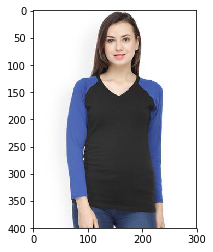

In [6]:
img = plt.imread(f'{PATH}test/{files[1]}')
plt.imshow(img);

Here is how the raw data looks like

In [18]:
img.shape

(400, 300, 3)

In [18]:
img[:4,:4]

array([[[209, 211, 210],
        [209, 211, 210],
        [209, 211, 210],
        [209, 211, 210]],

       [[209, 211, 210],
        [209, 211, 210],
        [209, 211, 210],
        [209, 211, 210]],

       [[209, 211, 210],
        [209, 211, 210],
        [209, 211, 210],
        [209, 211, 210]],

       [[210, 212, 211],
        [210, 212, 211],
        [210, 212, 211],
        [210, 212, 211]]], dtype=uint8)

## Our first model: quick start

We're going to use a <b>pre-trained</b> model, that is, a model created by some one else to solve a different problem. Instead of building a model from scratch to solve a similar problem, we'll use a model trained on ImageNet (1.2 million images and 1000 classes) as a starting point. The model is a Convolutional Neural Network (CNN), a type of Neural Network that builds state-of-the-art models for computer vision. We'll be learning all about CNNs during this course.

We will be using the <b>resnet34</b> model. resnet34 is a version of the model that won the 2015 ImageNet competition. Here is more info on [resnet models](https://github.com/KaimingHe/deep-residual-networks). We'll be studying them in depth later, but for now we'll focus on using them effectively.

Here's how to train and evalulate a *dogs vs cats* model in 3 lines of code, and under 20 seconds:

In [6]:
# Uncomment the below if you need to reset your precomputed activations
# shutil.rmtree(f'{PATH}tmp', ignore_errors=True)

In [10]:
labels_csv = f'{PATH}labels.csv'
n = len(list(open(labels_csv))) - 1
val_idxs = get_cv_idxs(n)

In [11]:
n

38603

In [12]:
len(val_idxs)

7720

In [13]:
train_images = n - len(val_idxs)
train_images

30883

In [14]:
val_idxs

array([35952, 38560, 26594, ..., 33771, 37392,  7937])

### Stratified KFold Cross Validation Preparation

In [19]:
labels_csv = f'{PATH}labels.csv'
arch=resnet34
def get_data(sz, val_idxs, bs=64):
    transforms=transforms_top_down
    tfms = tfms_from_model(arch, sz, aug_tfms=transforms_side_on, max_zoom=1.1)
    return ImageClassifierData.from_csv(PATH, 'train', labels_csv, val_idxs=val_idxs, test_name='test', tfms=tfms, bs=bs)

In [20]:
from sklearn.model_selection import StratifiedKFold
#get the full dataset first and then use that to split
data = get_data(sz, [0])
skf = StratifiedKFold(n_splits=5, random_state=234, shuffle=True)
splits = skf.split(np.zeros(len(data.trn_y)), data.trn_y)
datas = []
for train_index, val_index in splits:
    datas.append(get_data(sz, val_idxs=val_index))

In [21]:
learn = ConvLearner.pretrained(arch, datas[0],precompute=False)
#lrf=learn.lr_find()
#learn.sched.plot()

In [16]:
labels_csv = f'{PATH}labels.csv'
tfms = tfms_from_model(arch, sz, aug_tfms=transforms_side_on, max_zoom=1.1)
data = ImageClassifierData.from_csv(PATH, 'train', labels_csv, val_idxs=[0], test_name='test', tfms=tfms, bs=bs)
learn = ConvLearner.pretrained(arch, data,precompute=False)

In [17]:
learn.load('myntra_cv_balanced')

In [35]:
#loop through each fold and train for a bit
val_predictions = []
test_predictions = []
test_tta = []
for data in datas:
    learn.set_data(data)
    learn.fit(0.01, 3, cycle_len=1, cycle_mult=2)
    log_preds = learn.TTA()
    preds = np.argmax(log_preds[0], axis=1)
    print(preds)
    val_predictions.append(preds)
    
    l_preds = learn.predict(is_test=True)
    preds_test = np.argmax(l_preds,axis=1)
    print(preds_test)
    test_predictions.append(preds_test)
    
    tta_preds = learn.TTA(is_test=True)
    tta_test = np.argmax(tta_preds[0], axis=1)
    print(tta_test)
    test_tta.append(tta_preds)
    
    #accuracy(log_preds,y), metrics.log_loss(y, probs)

HBox(children=(IntProgress(value=0, description='Epoch', max=7), HTML(value='')))

  2%|▏         | 11/452 [00:02<01:44,  4.24it/s, loss=1.7]

Exception in thread Thread-15:
Traceback (most recent call last):
  File "/home/paperspace/anaconda3/envs/fastai/lib/python3.6/threading.py", line 916, in _bootstrap_inner
    self.run()
  File "/home/paperspace/anaconda3/envs/fastai/lib/python3.6/site-packages/tqdm/_tqdm.py", line 144, in run
    for instance in self.tqdm_cls._instances:
  File "/home/paperspace/anaconda3/envs/fastai/lib/python3.6/_weakrefset.py", line 60, in __iter__
    for itemref in self.data:
RuntimeError: Set changed size during iteration



epoch      trn_loss   val_loss   accuracy                   
    0      1.750909   1.477286   0.557292  
    1      1.718617   1.480157   0.551809                   
    2      1.721101   1.462711   0.555099                   
    3      1.735554   1.464426   0.554962                   
    4      1.710653   1.451869   0.564556                   
    5      1.675409   1.432483   0.566749                   
    6      1.642341   1.42863    0.569353                   

[[1201  487 7149 7227 1170  348 1985 2326 3896 3374 3246 3864 7118 4237 4768 5246 4974 5517 5825 6012 6383
  6535 6920]
 [ 290  487 7149 7227 1157  348 1985 2305 3016 3374 3657 3864 7118 4238 4768 5246 5087 5401 5830 6012 6377
  6541 6939]
 [  75  487 7149 7227 1170  348 1985 2326 3077 3396 3657 3935 7118 4238 4683 5249 4963 5401 5830 6012 6376
  6535 6901]
 [ 281  544 7149 7181 1393  348 2006 2364 2631 3219 3529 3935 7118 4237 4746 5269 5048 5424 5830 6059 6377
  6541 6932]
 [2418  547 7149  961 1170 1654 1985 2305 2631 3

HBox(children=(IntProgress(value=0, description='Epoch', max=7), HTML(value='')))

epoch      trn_loss   val_loss   accuracy                   
    0      1.659121   1.402295   0.57045   
    1      1.683992   1.401898   0.566749                   
    2      1.627613   1.393306   0.57278                    
    3      1.675713   1.4137     0.565378                   
    4      1.644615   1.390662   0.572094                   
    5      1.605854   1.379093   0.584293                   
    6      1.548645   1.378986   0.584156                   

[[ 323  698 7141 7209 1424 1830 2013 2410 3017 3409 3550 3826 7079 4250 4835 5263 5007 5636 5844 6021 6384
  6570 6943]
 [ 416  471 7169 7209 1409 1830 2014 2410 2635 3304 3551 3903 7079 4268 4835 5263 4988 5408 5846 6072 6387
  6570 6943]
 [2926  489 7138  938 1424 1830 2002 2337 3033 3221 3672 3914 7095 4270 4835 5263 4995 5402 5846 6072 6385
  6570 6938]
 [ 323  489 7127  978 1273 2528 2014 2335 3055 3409 3550 3766 7079 4212 4737 5276 4994 5433 5846 6073 6385
  6791 6943]
 [ 323  474 7127 7218 1424 7083 2002 2410 3055 3

HBox(children=(IntProgress(value=0, description='Epoch', max=7), HTML(value='')))

epoch      trn_loss   val_loss   accuracy                   
    0      1.657702   1.286611   0.614605  
    1      1.613361   1.300672   0.610731                   
    2      1.586546   1.295038   0.607687                   
    3      1.634971   1.305243   0.606583                   
    4      1.589049   1.291629   0.606721                   
    5      1.545982   1.281455   0.612803                   
    6      1.509891   1.281433   0.609614                   

[[1601  536 7155 7179 1480 1609 1987 2367 3070 3206 3541 3925 7059 4232 4818 5251 4977 5462 5812 5992 6365
  6536 6915]
 [ 177  486 7155 7188 1298 1609 1987 2367 2930 3216 3541 3925 7059 4232 4752 5250 4959 5448 5814 1177 6365
  6539 7046]
 [ 177  536 7110 7179 1244 1583 1983 2367 3035 3216 3541 3740 7101 4232 4752 5251 4957 5420 5812 6033 6366
  6536 6912]
 [ 177  483 7155  952 1392 1583 1988 2367 2630 3352 3488 3920 7059 4344 4818 5268 4961 5357 5812 6033 6365
  6539 6912]
 [ 304  492 7118 7206 1392 1733 1981 2367 3035 3

HBox(children=(IntProgress(value=0, description='Epoch', max=7), HTML(value='')))

epoch      trn_loss   val_loss   accuracy                   
    0      1.571354   1.231322   0.635094  
    1      1.609575   1.24322    0.62903                    
    2      1.548217   1.238303   0.632724                   
    3      1.554787   1.255544   0.623756                   
    4      1.55444    1.247265   0.626205                   
    5      1.517894   1.232245   0.63063                    
    6      1.507922   1.234405   0.632704                   

[[2505  488 7138 7177 1412 1803 2012 2256 2999 3195 3513 3729 7087 4224 4764 5222 4833 5667 5791 6092 6347
  6506 6887]
 [ 226  489 7138 7180 1174 3105 1974 2293 2749 3364 3513 3859 7058 4227 4730 5222 5028 5667 5761 6019 6349
  6511 6955]
 [2255  488 7098 7177 1412 1803 1932 2256 2985 3186 3520 2849 7070 4224 4764 5222 4959 5322 5800 6019 6347
  6505 6929]
 [ 513  466 7138 7180 1412 1619 1932 2197 2999 3186 3522 3799 7087 4308 4783 5232 4942 5340 5795 6102 6350
  6506 6929]
 [ 320  466 7092 7177 1412 1590 1974 2197 2999 3

HBox(children=(IntProgress(value=0, description='Epoch', max=7), HTML(value='')))

epoch      trn_loss   val_loss   accuracy                   
    0      1.554337   1.14793    0.662175  
    1      1.523793   1.171844   0.654878                   
    2      1.512962   1.161188   0.658473                   
    3      1.531015   1.176998   0.657229                   
    4      1.504227   1.172175   0.649762                   
    5      1.493061   1.163297   0.654293                   
    6      1.466148   1.164414   0.654538                   

[[3865  614 7135 7169 1593 1800 2006 2360 3036 3480 3548 3783 7122 4271 4824 5292 5065 5640 5856 6077 6376
  6555 6935]
 [ 292  474 7125 7169 1465 1681 2006 2258 3057 3338 3549 3850 7122 4259 4849 5284 4988 5640 5893 6077 6377
  6555 6920]
 [  85  614 7128 7169 1407 1681 2018 2361 3090 3480 3549 3850 7118 4271 4793 5300 4888 5391 5836 6077 6376
  6553 6904]
 [ 284  543 7128 7169 1187 1798 2017 2361 2775 3480 3549 3850 7113 4350 4819 5266 4887 5392 5856 6077 6378
  6555 7024]
 [ 431  543 7128 7169 1505 1839 2005 2360 3098 3

In [36]:
learn.save('myntra-cv-balanced-Extra-data-5CVFOlds')

In [185]:
learn.load('myntra-cv-balanced-10CVFOlds')

In [37]:
test_predictions

[array([ 1,  4, 17, ...,  1,  6, 21]),
 array([ 1,  4, 17, ...,  1,  6, 21]),
 array([ 1,  4, 17, ...,  1,  0, 21]),
 array([ 1,  4, 17, ..., 22,  6, 21]),
 array([ 1,  4, 17, ..., 22,  6, 21])]

In [111]:
new_path = f'{PATH}new_file.txt'
new_preds = open(new_path,'w')
new_preds.write(str(test_predictions))
print(test_predictions)
new_preds.close()

[array([ 1,  4, 17, ...,  1, 21, 21]), array([ 1,  4, 17, ...,  1, 21, 21]), array([ 1,  4, 17, ...,  1,  8, 21]), array([ 1,  4, 17, ...,  1, 21, 21]), array([ 1,  4, 17, ...,  1,  0, 21]), array([ 1,  4, 17, ...,  1, 21, 21]), array([ 1,  4, 17, ...,  1, 21, 21]), array([ 1,  4, 17, ...,  1,  0, 21]), array([ 1,  4, 17, ...,  1, 21, 21]), array([ 1,  4, 17, ...,  1, 21, 21])]


In [38]:
print(test_predictions[0][:25])
print(test_predictions[1][:25])
print(test_predictions[2][:25])
print(test_predictions[3][:25])
print(test_predictions[4][:25])
print(test_predictions[5][:25])
print(test_predictions[6][:25])
print(test_predictions[7][:25])
print(test_predictions[8][:25])
print(test_predictions[9][:25])

[ 1  4 17 22 14 14 19 22  4 21  8  4 20  6  0 17  9 14  9 17  7  4 18 14 14]
[ 1  4 17 22 14 14 19 18  4 10 18  4 20  6 11 17  9 14 22 17  7  4 18 14 14]
[ 1  4 17 22 14 14  4 18  4 21  9  4 20  6 11 17  5 14 22 17  7  4 18 14 14]
[ 1  4 17 22 14 14  4 22 17 21 18  4 20  6 11 17  5 14 22 17  7  4 18 14  7]
[ 1  4 17 22 14 14  4 22 17 21  8  4 20  6 11 17  5 14 22 17  7  4 18 14 14]


IndexError: list index out of range

In [125]:
a1 = test_predictions[0]
print(len(a1[:]))
print(type(a1))
print(a1[4])
print(np.argmax(test_predictions, axis=0))

15000
<class 'numpy.ndarray'>
14
[0 0 0 ... 0 0 0]


In [40]:
dict2 = []
import operator
for i in range(15000):
    dict1 = {}
    for j in range(5):
        if test_predictions[j][i] in dict1:
            dict1[test_predictions[j][i]] += 1
        else:
            dict1[test_predictions[j][i]] = 1
    print(dict1)
    print('class for ' + str(i) + 'th sample is ' + str(max(dict1.items(), key=operator.itemgetter(1))[0]))
    dict2.append(max(dict1.items(), key=operator.itemgetter(1))[0])

print(dict2)
        

{1: 5}
class for 0th sample is 1
{4: 5}
class for 1th sample is 4
{17: 5}
class for 2th sample is 17
{22: 5}
class for 3th sample is 22
{14: 5}
class for 4th sample is 14
{14: 5}
class for 5th sample is 14
{19: 2, 4: 3}
class for 6th sample is 4
{22: 3, 18: 2}
class for 7th sample is 22
{4: 3, 17: 2}
class for 8th sample is 4
{21: 4, 10: 1}
class for 9th sample is 21
{8: 2, 18: 2, 9: 1}
class for 10th sample is 8
{4: 5}
class for 11th sample is 4
{20: 5}
class for 12th sample is 20
{6: 5}
class for 13th sample is 6
{0: 1, 11: 4}
class for 14th sample is 11
{17: 5}
class for 15th sample is 17
{9: 2, 5: 3}
class for 16th sample is 5
{14: 5}
class for 17th sample is 14
{9: 1, 22: 4}
class for 18th sample is 22
{17: 5}
class for 19th sample is 17
{7: 5}
class for 20th sample is 7
{4: 5}
class for 21th sample is 4
{18: 5}
class for 22th sample is 18
{14: 5}
class for 23th sample is 14
{14: 4, 7: 1}
class for 24th sample is 14
{14: 5}
class for 25th sample is 14
{13: 5}
class for 26th sample

{22: 5}
class for 1396th sample is 22
{4: 5}
class for 1397th sample is 4
{4: 5}
class for 1398th sample is 4
{14: 5}
class for 1399th sample is 14
{14: 5}
class for 1400th sample is 14
{12: 2, 7: 3}
class for 1401th sample is 7
{13: 3, 20: 2}
class for 1402th sample is 13
{13: 5}
class for 1403th sample is 13
{12: 4, 14: 1}
class for 1404th sample is 12
{4: 5}
class for 1405th sample is 4
{21: 5}
class for 1406th sample is 21
{17: 5}
class for 1407th sample is 17
{19: 1, 13: 1, 21: 1, 22: 2}
class for 1408th sample is 22
{7: 1, 22: 4}
class for 1409th sample is 22
{21: 5}
class for 1410th sample is 21
{17: 5}
class for 1411th sample is 17
{7: 5}
class for 1412th sample is 7
{22: 5}
class for 1413th sample is 22
{14: 5}
class for 1414th sample is 14
{7: 2, 1: 3}
class for 1415th sample is 1
{18: 5}
class for 1416th sample is 18
{1: 5}
class for 1417th sample is 1
{17: 5}
class for 1418th sample is 17
{21: 5}
class for 1419th sample is 21
{4: 5}
class for 1420th sample is 4
{4: 5}
class

class for 2343th sample is 8
{14: 5}
class for 2344th sample is 14
{4: 5}
class for 2345th sample is 4
{16: 5}
class for 2346th sample is 16
{14: 5}
class for 2347th sample is 14
{14: 5}
class for 2348th sample is 14
{16: 5}
class for 2349th sample is 16
{14: 5}
class for 2350th sample is 14
{17: 5}
class for 2351th sample is 17
{14: 5}
class for 2352th sample is 14
{8: 3, 5: 2}
class for 2353th sample is 8
{14: 5}
class for 2354th sample is 14
{14: 5}
class for 2355th sample is 14
{14: 4, 12: 1}
class for 2356th sample is 14
{17: 5}
class for 2357th sample is 17
{2: 5}
class for 2358th sample is 2
{22: 5}
class for 2359th sample is 22
{17: 5}
class for 2360th sample is 17
{13: 5}
class for 2361th sample is 13
{19: 4, 9: 1}
class for 2362th sample is 19
{14: 5}
class for 2363th sample is 14
{14: 2, 4: 3}
class for 2364th sample is 4
{11: 5}
class for 2365th sample is 11
{4: 5}
class for 2366th sample is 4
{18: 5}
class for 2367th sample is 18
{4: 5}
class for 2368th sample is 4
{14: 5}

class for 3483th sample is 14
{14: 5}
class for 3484th sample is 14
{11: 5}
class for 3485th sample is 11
{16: 5}
class for 3486th sample is 16
{16: 5}
class for 3487th sample is 16
{14: 5}
class for 3488th sample is 14
{22: 5}
class for 3489th sample is 22
{14: 5}
class for 3490th sample is 14
{4: 5}
class for 3491th sample is 4
{17: 5}
class for 3492th sample is 17
{17: 5}
class for 3493th sample is 17
{21: 4, 8: 1}
class for 3494th sample is 21
{14: 4, 13: 1}
class for 3495th sample is 14
{14: 5}
class for 3496th sample is 14
{5: 5}
class for 3497th sample is 5
{17: 5}
class for 3498th sample is 17
{14: 5}
class for 3499th sample is 14
{14: 5}
class for 3500th sample is 14
{21: 2, 15: 3}
class for 3501th sample is 15
{17: 5}
class for 3502th sample is 17
{8: 5}
class for 3503th sample is 8
{7: 4, 5: 1}
class for 3504th sample is 7
{2: 5}
class for 3505th sample is 2
{22: 5}
class for 3506th sample is 22
{17: 5}
class for 3507th sample is 17
{17: 5}
class for 3508th sample is 17
{16:

{11: 2, 6: 3}
class for 4688th sample is 6
{14: 5}
class for 4689th sample is 14
{4: 2, 14: 3}
class for 4690th sample is 14
{17: 5}
class for 4691th sample is 17
{14: 5}
class for 4692th sample is 14
{14: 4, 12: 1}
class for 4693th sample is 14
{17: 5}
class for 4694th sample is 17
{14: 5}
class for 4695th sample is 14
{18: 2, 9: 3}
class for 4696th sample is 9
{15: 3, 16: 2}
class for 4697th sample is 15
{4: 5}
class for 4698th sample is 4
{14: 5}
class for 4699th sample is 14
{4: 5}
class for 4700th sample is 4
{14: 5}
class for 4701th sample is 14
{11: 1, 9: 4}
class for 4702th sample is 9
{17: 5}
class for 4703th sample is 17
{4: 5}
class for 4704th sample is 4
{6: 2, 21: 3}
class for 4705th sample is 21
{21: 5}
class for 4706th sample is 21
{14: 5}
class for 4707th sample is 14
{11: 5}
class for 4708th sample is 11
{17: 5}
class for 4709th sample is 17
{0: 2, 8: 1, 15: 2}
class for 4710th sample is 0
{16: 3, 21: 2}
class for 4711th sample is 16
{17: 5}
class for 4712th sample is 

class for 5761th sample is 14
{14: 3, 13: 2}
class for 5762th sample is 14
{4: 2, 17: 3}
class for 5763th sample is 17
{7: 5}
class for 5764th sample is 7
{21: 1, 8: 1, 1: 3}
class for 5765th sample is 1
{17: 5}
class for 5766th sample is 17
{8: 2, 0: 3}
class for 5767th sample is 0
{21: 5}
class for 5768th sample is 21
{14: 3, 3: 1, 7: 1}
class for 5769th sample is 14
{13: 4, 4: 1}
class for 5770th sample is 13
{4: 5}
class for 5771th sample is 4
{17: 5}
class for 5772th sample is 17
{10: 5}
class for 5773th sample is 10
{17: 5}
class for 5774th sample is 17
{14: 5}
class for 5775th sample is 14
{14: 5}
class for 5776th sample is 14
{21: 5}
class for 5777th sample is 21
{14: 5}
class for 5778th sample is 14
{9: 3, 15: 2}
class for 5779th sample is 9
{14: 3, 13: 2}
class for 5780th sample is 14
{4: 3, 17: 2}
class for 5781th sample is 4
{5: 5}
class for 5782th sample is 5
{14: 1, 15: 2, 22: 1, 16: 1}
class for 5783th sample is 15
{14: 5}
class for 5784th sample is 14
{4: 5}
class for 5

{17: 5}
class for 7118th sample is 17
{4: 5}
class for 7119th sample is 4
{4: 5}
class for 7120th sample is 4
{14: 5}
class for 7121th sample is 14
{21: 5}
class for 7122th sample is 21
{14: 5}
class for 7123th sample is 14
{18: 3, 15: 2}
class for 7124th sample is 18
{14: 5}
class for 7125th sample is 14
{16: 4, 4: 1}
class for 7126th sample is 16
{14: 5}
class for 7127th sample is 14
{2: 5}
class for 7128th sample is 2
{14: 5}
class for 7129th sample is 14
{21: 5}
class for 7130th sample is 21
{22: 5}
class for 7131th sample is 22
{17: 5}
class for 7132th sample is 17
{14: 5}
class for 7133th sample is 14
{17: 5}
class for 7134th sample is 17
{21: 5}
class for 7135th sample is 21
{4: 5}
class for 7136th sample is 4
{3: 2, 17: 3}
class for 7137th sample is 17
{21: 5}
class for 7138th sample is 21
{9: 3, 18: 1, 21: 1}
class for 7139th sample is 9
{0: 5}
class for 7140th sample is 0
{4: 5}
class for 7141th sample is 4
{14: 5}
class for 7142th sample is 14
{11: 5}
class for 7143th sample

class for 8122th sample is 11
{17: 5}
class for 8123th sample is 17
{14: 5}
class for 8124th sample is 14
{0: 5}
class for 8125th sample is 0
{15: 5}
class for 8126th sample is 15
{14: 5}
class for 8127th sample is 14
{9: 5}
class for 8128th sample is 9
{14: 5}
class for 8129th sample is 14
{21: 5}
class for 8130th sample is 21
{9: 3, 18: 2}
class for 8131th sample is 9
{5: 5}
class for 8132th sample is 5
{20: 3, 0: 1, 11: 1}
class for 8133th sample is 20
{22: 3, 16: 2}
class for 8134th sample is 22
{19: 1, 0: 1, 16: 1, 7: 2}
class for 8135th sample is 7
{17: 5}
class for 8136th sample is 17
{17: 5}
class for 8137th sample is 17
{21: 5}
class for 8138th sample is 21
{4: 5}
class for 8139th sample is 4
{21: 3, 22: 1, 15: 1}
class for 8140th sample is 21
{7: 1, 14: 3, 13: 1}
class for 8141th sample is 14
{7: 5}
class for 8142th sample is 7
{15: 5}
class for 8143th sample is 15
{14: 5}
class for 8144th sample is 14
{14: 5}
class for 8145th sample is 14
{14: 5}
class for 8146th sample is 1

{4: 3, 14: 2}
class for 9627th sample is 4
{13: 5}
class for 9628th sample is 13
{6: 5}
class for 9629th sample is 6
{22: 5}
class for 9630th sample is 22
{17: 5}
class for 9631th sample is 17
{19: 5}
class for 9632th sample is 19
{14: 4, 4: 1}
class for 9633th sample is 14
{14: 5}
class for 9634th sample is 14
{8: 1, 1: 4}
class for 9635th sample is 1
{14: 5}
class for 9636th sample is 14
{4: 1, 14: 4}
class for 9637th sample is 14
{8: 5}
class for 9638th sample is 8
{14: 5}
class for 9639th sample is 14
{14: 3, 13: 2}
class for 9640th sample is 14
{22: 1, 21: 3, 9: 1}
class for 9641th sample is 21
{21: 3, 22: 2}
class for 9642th sample is 21
{6: 5}
class for 9643th sample is 6
{5: 3, 8: 1, 21: 1}
class for 9644th sample is 5
{15: 5}
class for 9645th sample is 15
{8: 4, 6: 1}
class for 9646th sample is 8
{4: 5}
class for 9647th sample is 4
{17: 5}
class for 9648th sample is 17
{4: 5}
class for 9649th sample is 4
{4: 3, 17: 1, 7: 1}
class for 9650th sample is 4
{8: 2, 0: 3}
class for 9

class for 10418th sample is 14
{17: 5}
class for 10419th sample is 17
{8: 5}
class for 10420th sample is 8
{17: 5}
class for 10421th sample is 17
{21: 5}
class for 10422th sample is 21
{13: 5}
class for 10423th sample is 13
{13: 5}
class for 10424th sample is 13
{21: 5}
class for 10425th sample is 21
{4: 5}
class for 10426th sample is 4
{21: 3, 22: 2}
class for 10427th sample is 21
{14: 5}
class for 10428th sample is 14
{8: 4, 20: 1}
class for 10429th sample is 8
{4: 5}
class for 10430th sample is 4
{16: 3, 15: 1, 1: 1}
class for 10431th sample is 16
{20: 5}
class for 10432th sample is 20
{7: 5}
class for 10433th sample is 7
{14: 4, 4: 1}
class for 10434th sample is 14
{20: 4, 0: 1}
class for 10435th sample is 20
{7: 5}
class for 10436th sample is 7
{6: 5}
class for 10437th sample is 6
{17: 5}
class for 10438th sample is 17
{4: 5}
class for 10439th sample is 4
{4: 3, 13: 2}
class for 10440th sample is 4
{11: 5}
class for 10441th sample is 11
{8: 4, 0: 1}
class for 10442th sample is 8
{

{16: 5}
class for 11663th sample is 16
{11: 5}
class for 11664th sample is 11
{21: 5}
class for 11665th sample is 21
{21: 5}
class for 11666th sample is 21
{22: 3, 16: 2}
class for 11667th sample is 22
{12: 1, 7: 4}
class for 11668th sample is 7
{8: 1, 1: 2, 0: 1, 15: 1}
class for 11669th sample is 1
{14: 5}
class for 11670th sample is 14
{14: 4, 13: 1}
class for 11671th sample is 14
{12: 5}
class for 11672th sample is 12
{17: 5}
class for 11673th sample is 17
{13: 2, 14: 3}
class for 11674th sample is 14
{14: 5}
class for 11675th sample is 14
{4: 5}
class for 11676th sample is 4
{21: 2, 22: 3}
class for 11677th sample is 22
{14: 5}
class for 11678th sample is 14
{9: 5}
class for 11679th sample is 9
{13: 3, 14: 2}
class for 11680th sample is 13
{21: 5}
class for 11681th sample is 21
{14: 5}
class for 11682th sample is 14
{21: 5}
class for 11683th sample is 21
{17: 5}
class for 11684th sample is 17
{2: 3, 8: 2}
class for 11685th sample is 2
{14: 2, 19: 3}
class for 11686th sample is 19


class for 12880th sample is 22
{21: 5}
class for 12881th sample is 21
{14: 5}
class for 12882th sample is 14
{0: 5}
class for 12883th sample is 0
{22: 5}
class for 12884th sample is 22
{9: 3, 22: 2}
class for 12885th sample is 9
{14: 5}
class for 12886th sample is 14
{4: 5}
class for 12887th sample is 4
{16: 2, 21: 3}
class for 12888th sample is 21
{6: 5}
class for 12889th sample is 6
{16: 5}
class for 12890th sample is 16
{17: 5}
class for 12891th sample is 17
{14: 4, 13: 1}
class for 12892th sample is 14
{17: 5}
class for 12893th sample is 17
{13: 5}
class for 12894th sample is 13
{14: 5}
class for 12895th sample is 14
{11: 5}
class for 12896th sample is 11
{15: 5}
class for 12897th sample is 15
{11: 2, 21: 2, 9: 1}
class for 12898th sample is 11
{21: 2, 1: 3}
class for 12899th sample is 1
{8: 1, 6: 4}
class for 12900th sample is 6
{4: 4, 14: 1}
class for 12901th sample is 4
{13: 5}
class for 12902th sample is 13
{21: 1, 11: 1, 8: 3}
class for 12903th sample is 8
{14: 5}
class for 12

{14: 5}
class for 14019th sample is 14
{14: 5}
class for 14020th sample is 14
{17: 5}
class for 14021th sample is 17
{14: 4, 13: 1}
class for 14022th sample is 14
{3: 2, 17: 3}
class for 14023th sample is 17
{14: 5}
class for 14024th sample is 14
{2: 5}
class for 14025th sample is 2
{14: 5}
class for 14026th sample is 14
{14: 5}
class for 14027th sample is 14
{8: 5}
class for 14028th sample is 8
{13: 5}
class for 14029th sample is 13
{4: 5}
class for 14030th sample is 4
{14: 5}
class for 14031th sample is 14
{14: 5}
class for 14032th sample is 14
{20: 2, 11: 1, 14: 2}
class for 14033th sample is 20
{7: 5}
class for 14034th sample is 7
{2: 2, 14: 3}
class for 14035th sample is 14
{8: 5}
class for 14036th sample is 8
{17: 5}
class for 14037th sample is 17
{14: 3, 13: 2}
class for 14038th sample is 14
{22: 5}
class for 14039th sample is 22
{8: 4, 11: 1}
class for 14040th sample is 8
{1: 5}
class for 14041th sample is 1
{4: 5}
class for 14042th sample is 4
{16: 5}
class for 14043th sample 

In [41]:
for i in range(15000):
    submission['Sub_category'][i] =  data.classes[dict2[i]]

In [42]:
submission['Sub_category'].value_counts()

Solid                     3417
Striped                   1903
Colourblocked             1671
Typography                1289
Self_Design                968
Sports_and_Team_Jersey     795
People_and_Places          543
Varsity                    447
Graphic                    447
Geometric                  436
Floral                     415
Sports                     392
Biker                      384
Humour_and_Comic           363
Abstract                   328
Tie_and_Dye                227
Conversational             222
Superhero                  150
Tribal                     138
Camouflage                 127
Music                      122
Polka_Dots                 114
Checked                    102
Name: Sub_category, dtype: int64

In [128]:
preds = np.argmax(log_preds[0], axis=1)
preds[:25]

(array([15, 11, 17,  0,  8,  6, 19,  6,  9,  1,  6,  7,  6, 12, 14,  8,  6, 12, 10,  6,  8,  6,  1, 17,  0]),
 array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]))

In [129]:
learn.save('myntra_cv_balanced_2')

In [60]:
learn.load('myntra_cv_balanced')

In [188]:
l_preds = learn.predict(is_test=True)
preds1 = np.argmax(l_preds,axis=1)
preds1

array([ 1,  4, 17, ...,  1, 21, 21])

In [165]:
test_predictions

[array([ 1,  4, 17, ...,  1, 21, 21]),
 array([ 1,  4, 17, ...,  1, 21, 21]),
 array([ 1,  4, 17, ...,  1,  8, 21]),
 array([ 1,  4, 17, ...,  1, 21, 21]),
 array([ 1,  4, 17, ...,  1,  0, 21]),
 array([ 1,  4, 17, ...,  1, 21, 21]),
 array([ 1,  4, 17, ...,  1, 21, 21]),
 array([ 1,  4, 17, ...,  1,  0, 21]),
 array([ 1,  4, 17, ...,  1, 21, 21]),
 array([ 1,  4, 17, ...,  1, 21, 21])]

In [67]:
sol_dict1 = {}
data.classes[test_predictions[0][1]]

'Colourblocked'

In [25]:
#for i in range(15000):
    #print('Filename: ' + data.test_dl.dataset.fnames[i].split('/')[1].split('_')[1] +'.jpg' + '\t' + 'Class: ' + data.classes[test_predictions[0][i]])

sol_dict3 = {data.test_dl.dataset.fnames[i].split('/')[1].split('_')[1] : data.classes[test_predictions[0][i]] for i in range(15000) }
print(sol_dict3)

{'5507': 'People_and_Places', '7288': 'Colourblocked', '5110': 'Striped', '12818': 'Varsity', '6862': 'Solid', '5267': 'Solid', '5905': 'Colourblocked', '523': 'Varsity', '4537': 'Colourblocked', '2894': 'Typography', '9618': 'Graphic', '12786': 'Colourblocked', '995': 'Tribal', '1282': 'Floral', '9319': 'People_and_Places', '10759': 'Striped', '1405': 'Humour_and_Comic', '6165': 'Solid', '2934': 'Humour_and_Comic', '14358': 'Striped', '9115': 'Geometric', '2676': 'Colourblocked', '11208': 'Sports_and_Team_Jersey', '13686': 'Solid', '2475': 'Solid', '13508': 'Solid', '1418': 'Self_Design', '7546': 'Typography', '9312': 'Striped', '11550': 'Humour_and_Comic', '3406': 'Conversational', '4613': 'Solid', '14207': 'Sports_and_Team_Jersey', '12978': 'Self_Design', '14946': 'Striped', '7981': 'Solid', '9286': 'Graphic', '317': 'Colourblocked', '355': 'Typography', '11201': 'Solid', '11593': 'Superhero', '12325': 'Geometric', '7193': 'Self_Design', '8832': 'Solid', '2010': 'Solid', '8970': 'Sp

In [189]:
sol_dict7 = {}
for i in range(15000):
    print('Filename: ' + data.test_dl.dataset.fnames[i].split('/')[1].split('_')[1] +'.jpg' + '\t' + 'Class: ' + data.classes[preds1[i]])

sol_dict7 = {data.test_dl.dataset.fnames[i].split('/')[1].split('_')[1] : data.classes[preds1[i]] for i in range(15000) }
print(sol_dict7)

Filename: 5507.jpg	Class: Biker
Filename: 7288.jpg	Class: Colourblocked
Filename: 5110.jpg	Class: Striped
Filename: 12818.jpg	Class: Varsity
Filename: 6862.jpg	Class: Solid
Filename: 5267.jpg	Class: Solid
Filename: 5905.jpg	Class: Colourblocked
Filename: 523.jpg	Class: Varsity
Filename: 4537.jpg	Class: Striped
Filename: 2894.jpg	Class: Typography
Filename: 9618.jpg	Class: Humour_and_Comic
Filename: 12786.jpg	Class: Colourblocked
Filename: 995.jpg	Class: Typography
Filename: 1282.jpg	Class: Floral
Filename: 9319.jpg	Class: People_and_Places
Filename: 10759.jpg	Class: Striped
Filename: 1405.jpg	Class: Solid
Filename: 6165.jpg	Class: Solid
Filename: 2934.jpg	Class: Humour_and_Comic
Filename: 14358.jpg	Class: Striped
Filename: 9115.jpg	Class: Colourblocked
Filename: 2676.jpg	Class: Colourblocked
Filename: 11208.jpg	Class: Typography
Filename: 13686.jpg	Class: Solid
Filename: 2475.jpg	Class: Solid
Filename: 13508.jpg	Class: Solid
Filename: 1418.jpg	Class: Self_Design
Filename: 7546.jpg	Clas

Filename: 14776.jpg	Class: Solid
Filename: 10296.jpg	Class: Solid
Filename: 6692.jpg	Class: Typography
Filename: 14264.jpg	Class: Solid
Filename: 28.jpg	Class: Typography
Filename: 1298.jpg	Class: Striped
Filename: 9828.jpg	Class: Sports
Filename: 3443.jpg	Class: Solid
Filename: 11850.jpg	Class: Self_Design
Filename: 11474.jpg	Class: Striped
Filename: 7128.jpg	Class: Striped
Filename: 9760.jpg	Class: Typography
Filename: 12379.jpg	Class: Typography
Filename: 5502.jpg	Class: Colourblocked
Filename: 2363.jpg	Class: Striped
Filename: 4731.jpg	Class: Camouflage
Filename: 3789.jpg	Class: Solid
Filename: 6004.jpg	Class: Striped
Filename: 8470.jpg	Class: Humour_and_Comic
Filename: 13385.jpg	Class: Solid
Filename: 12554.jpg	Class: Striped
Filename: 5426.jpg	Class: Graphic
Filename: 14267.jpg	Class: Humour_and_Comic
Filename: 289.jpg	Class: Typography
Filename: 661.jpg	Class: Graphic
Filename: 4691.jpg	Class: Striped
Filename: 6013.jpg	Class: Sports_and_Team_Jersey
Filename: 3206.jpg	Class: Sol

Filename: 9931.jpg	Class: Sports
Filename: 7959.jpg	Class: Sports_and_Team_Jersey
Filename: 3631.jpg	Class: Humour_and_Comic
Filename: 11167.jpg	Class: Typography
Filename: 4625.jpg	Class: Geometric
Filename: 7125.jpg	Class: Graphic
Filename: 14203.jpg	Class: Solid
Filename: 4173.jpg	Class: Self_Design
Filename: 7839.jpg	Class: Solid
Filename: 13944.jpg	Class: People_and_Places
Filename: 6880.jpg	Class: Typography
Filename: 12560.jpg	Class: Self_Design
Filename: 8404.jpg	Class: Solid
Filename: 242.jpg	Class: Solid
Filename: 3607.jpg	Class: Solid
Filename: 6440.jpg	Class: Sports
Filename: 12139.jpg	Class: Biker
Filename: 8734.jpg	Class: Solid
Filename: 10861.jpg	Class: Typography
Filename: 4332.jpg	Class: Polka_Dots
Filename: 2089.jpg	Class: Striped
Filename: 2374.jpg	Class: Sports_and_Team_Jersey
Filename: 14826.jpg	Class: Solid
Filename: 10178.jpg	Class: Colourblocked
Filename: 14177.jpg	Class: Typography
Filename: 6468.jpg	Class: Humour_and_Comic
Filename: 14885.jpg	Class: Striped
Fi

Filename: 1561.jpg	Class: Solid
Filename: 8442.jpg	Class: Striped
Filename: 8599.jpg	Class: Solid
Filename: 10933.jpg	Class: People_and_Places
Filename: 4760.jpg	Class: Solid
Filename: 10203.jpg	Class: Solid
Filename: 966.jpg	Class: Colourblocked
Filename: 2504.jpg	Class: Striped
Filename: 11752.jpg	Class: Solid
Filename: 4676.jpg	Class: Striped
Filename: 8639.jpg	Class: Solid
Filename: 6319.jpg	Class: Solid
Filename: 5465.jpg	Class: Floral
Filename: 4236.jpg	Class: Conversational
Filename: 13682.jpg	Class: Colourblocked
Filename: 10767.jpg	Class: Solid
Filename: 3600.jpg	Class: Solid
Filename: 8570.jpg	Class: Colourblocked
Filename: 1353.jpg	Class: Solid
Filename: 7280.jpg	Class: Solid
Filename: 6715.jpg	Class: Striped
Filename: 14975.jpg	Class: Floral
Filename: 4352.jpg	Class: Solid
Filename: 12465.jpg	Class: Striped
Filename: 2172.jpg	Class: Sports_and_Team_Jersey
Filename: 11950.jpg	Class: Typography
Filename: 1700.jpg	Class: Typography
Filename: 14265.jpg	Class: Solid
Filename: 14

Filename: 3337.jpg	Class: Typography
Filename: 745.jpg	Class: Sports
Filename: 14142.jpg	Class: Colourblocked
Filename: 21.jpg	Class: Floral
Filename: 254.jpg	Class: Biker
Filename: 14485.jpg	Class: Striped
Filename: 3673.jpg	Class: Typography
Filename: 14524.jpg	Class: Conversational
Filename: 13370.jpg	Class: Solid
Filename: 8476.jpg	Class: Solid
Filename: 12427.jpg	Class: Solid
Filename: 2849.jpg	Class: Striped
Filename: 7920.jpg	Class: Biker
Filename: 6908.jpg	Class: Solid
Filename: 10812.jpg	Class: Solid
Filename: 14308.jpg	Class: Typography
Filename: 3633.jpg	Class: Colourblocked
Filename: 5787.jpg	Class: Geometric
Filename: 12000.jpg	Class: Floral
Filename: 6112.jpg	Class: Solid
Filename: 1398.jpg	Class: Typography
Filename: 12056.jpg	Class: Humour_and_Comic
Filename: 2268.jpg	Class: Abstract
Filename: 8285.jpg	Class: Humour_and_Comic
Filename: 12159.jpg	Class: Typography
Filename: 667.jpg	Class: Striped
Filename: 5930.jpg	Class: Colourblocked
Filename: 1311.jpg	Class: Striped
F

Filename: 9645.jpg	Class: Biker
Filename: 14025.jpg	Class: Solid
Filename: 1973.jpg	Class: Sports
Filename: 5961.jpg	Class: Typography
Filename: 1745.jpg	Class: Typography
Filename: 162.jpg	Class: Colourblocked
Filename: 4316.jpg	Class: Solid
Filename: 5557.jpg	Class: Self_Design
Filename: 7308.jpg	Class: Typography
Filename: 610.jpg	Class: Solid
Filename: 9782.jpg	Class: Camouflage
Filename: 2483.jpg	Class: Tie_and_Dye
Filename: 1047.jpg	Class: Humour_and_Comic
Filename: 5065.jpg	Class: Solid
Filename: 4312.jpg	Class: Typography
Filename: 7993.jpg	Class: Colourblocked
Filename: 2490.jpg	Class: Colourblocked
Filename: 14204.jpg	Class: Tie_and_Dye
Filename: 11419.jpg	Class: Colourblocked
Filename: 2936.jpg	Class: Solid
Filename: 4340.jpg	Class: Striped
Filename: 7592.jpg	Class: Solid
Filename: 11404.jpg	Class: Colourblocked
Filename: 3667.jpg	Class: Colourblocked
Filename: 4704.jpg	Class: Solid
Filename: 13534.jpg	Class: Solid
Filename: 5574.jpg	Class: Solid
Filename: 8909.jpg	Class: St

In [26]:
import pandas as pd

In [41]:
!ls {PATH}

labels.csv  models  sub_file.csv  test	tmp  train


In [27]:
submission = pd.read_csv(f'{PATH}sub_file.csv')

In [28]:
for i in range(15000):
    submission['Sub_category'][i] = sol_dict3[str(i)]

submission

/home/paperspace/anaconda3/envs/fastai/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/home/paperspace/anaconda3/envs/fastai/lib/python3.6/site-packages/pandas/core/indexing.py:194: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


,Brand,Category,Gender,Color,Link_to_the_image,Sub_category
0,Allen Solly,Tshirts,Men,Red,http://myntra.myntassets.com/assets/images/182...,Solid
1,Celio,Tshirts,Men,Yellow,http://myntra.myntassets.com/assets/images/109...,Solid
2,CULT FICTION,Tshirts,Men,Rust,http://myntra.myntassets.com/assets/images/159...,Solid
3,Antigravity,Tshirts,Women,Blue,http://myntra.myntassets.com/assets/images/185...,Conversational
4,Being Human,Tshirts,Men,Charcoal,http://myntra.myntassets.com/assets/images/100...,Sports_and_Team_Jersey
5,Adamo London,Tshirts,Men,Red,http://myntra.myntassets.com/assets/images/161...,Checked
6,Aeropostale,Tshirts,Women,White,http://myntra.myntassets.com/assets/images/206...,Typography
7,ESPRIT,Tshirts,Men,Navy Blue,http://myntra.myntassets.com/assets/images/234...,Colourblocked
8,2GO,Tshirts,Women,Grey,http://myntra.myntassets.com/assets/images/156...,Solid
9,American Crew,Tshirts,Men,Grey Melange,http://myntra.myntassets.com/assets/images/128...,Self_Design


In [71]:
for i in range(15000):
    submission['Sub_category'][i] = sol_dict1[str(i)]

submission

/home/paperspace/anaconda3/envs/fastai/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/home/paperspace/anaconda3/envs/fastai/lib/python3.6/site-packages/pandas/core/indexing.py:194: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


,Brand,Category,Gender,Color,Link_to_the_image,Sub_category
0,Allen Solly,Tshirts,Men,Red,http://myntra.myntassets.com/assets/images/182...,Solid
1,Celio,Tshirts,Men,Yellow,http://myntra.myntassets.com/assets/images/109...,Solid
2,CULT FICTION,Tshirts,Men,Rust,http://myntra.myntassets.com/assets/images/159...,Solid
3,Antigravity,Tshirts,Women,Blue,http://myntra.myntassets.com/assets/images/185...,Conversational
4,Being Human,Tshirts,Men,Charcoal,http://myntra.myntassets.com/assets/images/100...,Sports_and_Team_Jersey
5,Adamo London,Tshirts,Men,Red,http://myntra.myntassets.com/assets/images/161...,Checked
6,Aeropostale,Tshirts,Women,White,http://myntra.myntassets.com/assets/images/206...,Typography
7,ESPRIT,Tshirts,Men,Navy Blue,http://myntra.myntassets.com/assets/images/234...,Geometric
8,2GO,Tshirts,Women,Grey,http://myntra.myntassets.com/assets/images/156...,Solid
9,American Crew,Tshirts,Men,Grey Melange,http://myntra.myntassets.com/assets/images/128...,Solid


In [170]:
submission['Sub_category'].value_counts()

Solid                     4190
Typography                2179
Striped                   2026
Colourblocked             1417
Sports_and_Team_Jersey     656
Self_Design                593
Humour_and_Comic           526
People_and_Places          383
Geometric                  354
Floral                     351
Graphic                    348
Biker                      324
Varsity                    289
Abstract                   253
Sports                     213
Conversational             185
Tribal                     136
Superhero                  117
Camouflage                 106
Tie_and_Dye                103
Music                       99
Checked                     97
Polka_Dots                  55
Name: Sub_category, dtype: int64

In [29]:
submission['Sub_category'].value_counts()

Solid                     3373
Striped                   1891
Colourblocked             1472
Typography                1412
Self_Design               1026
Sports_and_Team_Jersey     789
Graphic                    524
People_and_Places          492
Varsity                    451
Sports                     445
Geometric                  411
Floral                     406
Humour_and_Comic           381
Biker                      372
Abstract                   309
Conversational             236
Tie_and_Dye                221
Tribal                     177
Camouflage                 163
Superhero                  138
Polka_Dots                 127
Music                       94
Checked                     90
Name: Sub_category, dtype: int64

In [30]:
submission.to_csv("vidai8.csv", index=False)

In [31]:
a = pd.read_csv("vidai8.csv")
a['Sub_category']

0                         Solid
1                         Solid
2                         Solid
3                Conversational
4        Sports_and_Team_Jersey
5                       Checked
6                    Typography
7                 Colourblocked
8                         Solid
9                   Self_Design
10                        Solid
11                    Geometric
12                        Biker
13                      Graphic
14                      Striped
15                        Biker
16                  Tie_and_Dye
17                        Biker
18                      Striped
19                  Tie_and_Dye
20                      Checked
21                       Floral
22                        Solid
23                Colourblocked
24             Humour_and_Comic
25       Sports_and_Team_Jersey
26                      Striped
27       Sports_and_Team_Jersey
28                   Typography
29               Conversational
                  ...          
14970   

In [32]:
a['Sub_category'] = a['Sub_category'].str.replace("_"," ")

In [33]:
a['Sub_category']

0                         Solid
1                         Solid
2                         Solid
3                Conversational
4        Sports and Team Jersey
5                       Checked
6                    Typography
7                 Colourblocked
8                         Solid
9                   Self Design
10                        Solid
11                    Geometric
12                        Biker
13                      Graphic
14                      Striped
15                        Biker
16                  Tie and Dye
17                        Biker
18                      Striped
19                  Tie and Dye
20                      Checked
21                       Floral
22                        Solid
23                Colourblocked
24             Humour and Comic
25       Sports and Team Jersey
26                      Striped
27       Sports and Team Jersey
28                   Typography
29               Conversational
                  ...          
14970   

In [34]:
a.to_csv("vidai8_new.csv", index=False)

In [180]:
a

,Brand,Category,Gender,Color,Link_to_the_image,Sub_category
0,Allen Solly,Tshirts,Men,Red,http://myntra.myntassets.com/assets/images/182...,Solid
1,Celio,Tshirts,Men,Yellow,http://myntra.myntassets.com/assets/images/109...,Solid
2,CULT FICTION,Tshirts,Men,Rust,http://myntra.myntassets.com/assets/images/159...,Solid
3,Antigravity,Tshirts,Women,Blue,http://myntra.myntassets.com/assets/images/185...,Conversational
4,Being Human,Tshirts,Men,Charcoal,http://myntra.myntassets.com/assets/images/100...,Sports and Team Jersey
5,Adamo London,Tshirts,Men,Red,http://myntra.myntassets.com/assets/images/161...,Checked
6,Aeropostale,Tshirts,Women,White,http://myntra.myntassets.com/assets/images/206...,Typography
7,ESPRIT,Tshirts,Men,Navy Blue,http://myntra.myntassets.com/assets/images/234...,Tie and Dye
8,2GO,Tshirts,Women,Grey,http://myntra.myntassets.com/assets/images/156...,Solid
9,American Crew,Tshirts,Men,Grey Melange,http://myntra.myntassets.com/assets/images/128...,Solid


In [89]:
test1 = np.argmax(test_tta[0],axis=1)
test2 = np.argmax(test_tta[1], axis=1)
test3 = np.argmax(test_tta[2], axis=1)
test4 = np.argmax(test_tta[3], axis=1)
test5 = np.argmax(test_tta[4], axis=1)
test1,test2, test3, test4, test5

(58,
 array([ 3, 15,  2,  1, 12]),
 array([13, 11,  5,  1,  2]),
 array([13,  1,  1,  8,  9]),
 array([13,  2, 12,  1,  3]))

In [90]:
test_tta[0]

array([[11611,  2886,  1144, 12992, 10531,  5462,  9943, 12581,  1717,  6172,  5193, 11950,   257, 14091,
         3540,   228,   779,  4918,  8236,  9632,  8120,  2072,  7567],
       [ 1921, 10870,  6303, 10630,  6957,  5462,  9643,  6942,  5873,  1523,  5193,  6206,   808,  1110,
         1814, 10817, 14349, 14400, 11868, 11014, 12930,  7928, 14392],
       [ 3856,  4516,  1144, 12992,  6957,  5462, 10286, 12233,  6763,  1523, 11722, 11241, 14858,  1689,
         2372, 10817, 12189,  3508,  9322,  7828,  6953, 10651,  7373],
       [12168, 14193,   177, 12992, 10266,  5462, 11899,    85,  4614,  7909,  5193, 13888,   257,  4073,
        10255,  6442,  4467,  6015, 11843,  9632, 12630,  2072,  6636],
       [ 8767, 14193,  6326, 12992,  2690, 14250, 12466, 12183, 13202,  7909,  5193, 13434,  1700,  9487,
         6408,  8458,   779,  9129,  7051,  9124,   293, 13644,  8713]])

In [94]:
t1 = np.argmax(test_tta[0][3]); t1

1

In [103]:
a = np.argmax(test_predictions)
a

array([3, 3, 3, 3, 3, 3, 3, 3, 3, 3])

In [96]:
len(test_predictions[0])

15000

In [31]:
!ls {PATH}

labels.csv  models  Submission_online.csv  test  tmp  train


In [152]:
files = os.listdir(f'{PATH}test')
#files

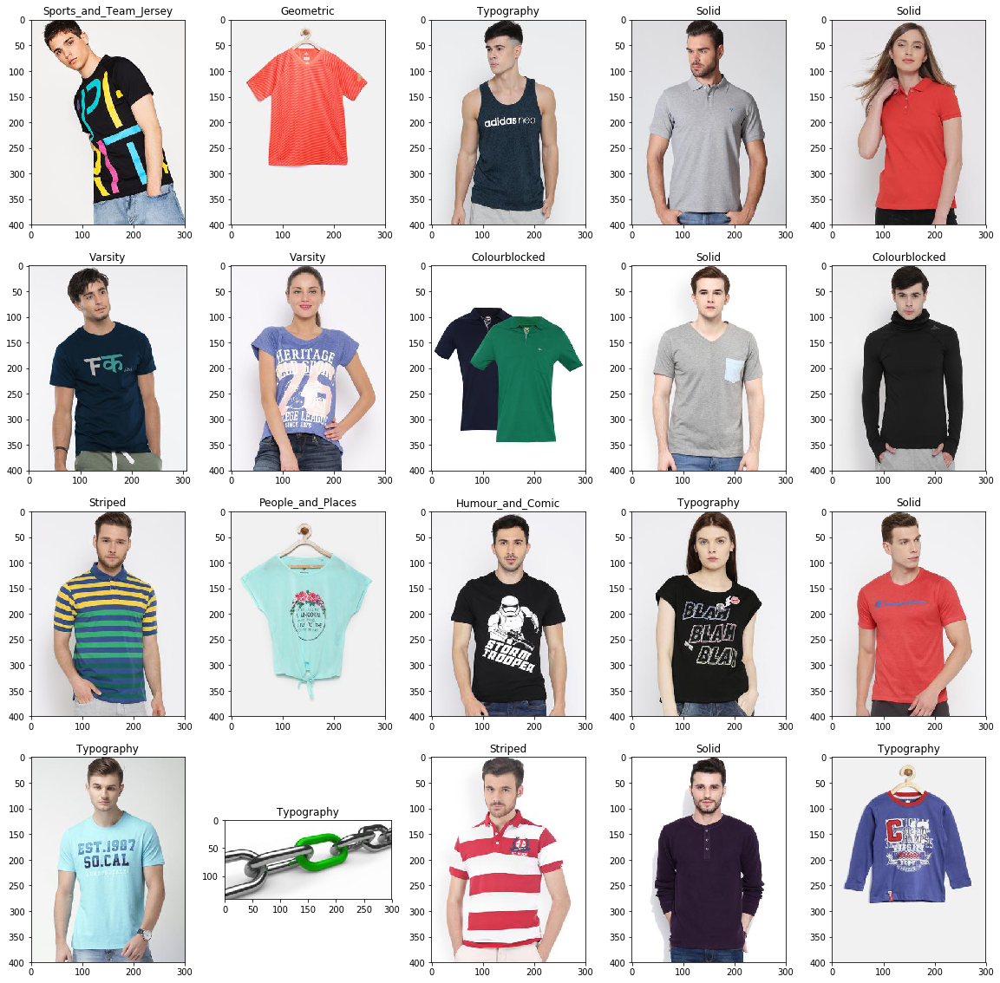

In [158]:
fig = plt.figure(figsize=(20,20))
for i in range(0,20):
    ax1 = fig.add_subplot(4,5,i+1)
    img = plt.imread(f'{PATH}test/{files[i+40]}')
    plt.title(data.classes[dict2[i+40]])
    plt.imshow(img);

In [94]:
log_preds[0][0]

array([-2.40372, -5.52576, -0.53857, -7.45026, -3.20758, -3.65342, -2.5147 , -4.06394, -3.68668, -5.5746 ,
       -6.4117 , -5.76202, -6.45133, -4.59539, -3.82415, -5.41244, -5.33715, -5.9239 , -4.86752, -2.79849,
       -5.75096, -5.83013, -5.73246], dtype=float32)

In [95]:
data.classes[2]

'Camouflage'

In [107]:
print(data.val_y[:800])
#for train_index, val_index in splits:
 #   print(val_index)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 

In [ ]:
for i in range(len(data.val_y)):
    data.classes[log_preds[0][i]]

In [121]:
preds1 = np.argmax(log_preds[0], axis=1)
preds2 = np.argmax(log_preds[1], axis=1)
preds3 = np.argmax(log_preds[2], axis=1)
preds4 = np.argmax(log_preds[3], axis=1)
preds5 = np.argmax(log_preds[4], axis=1)
preds1[:25], preds2[:25], preds3[:25], preds4[:25], preds5[:25]

(array([ 2,  6,  9,  8, 14,  5,  5, 14,  2,  1,  3, 14, 13,  8, 11,  8,  9,  8,  6,  8,  1,  4,  2, 11,  9]),
 array([ 0,  6,  9, 11, 19,  5,  5, 14,  2,  1,  3, 14, 14,  0, 11, 21, 21,  8,  8, 10,  1, 14,  2, 11, 21]),
 array([ 2,  6,  9,  0, 14,  5,  5, 14,  2,  1,  3, 14, 14,  0, 11, 22,  9,  8,  9,  8,  1, 19,  6,  6, 21]),
 array([ 2,  6,  9,  0, 14,  6,  5, 14,  2,  1,  7, 14, 13,  6, 11,  8,  9,  8,  6, 10,  1, 19,  2, 11, 21]),
 array([ 0,  6,  9,  8, 19,  6,  5, 14,  2,  1,  7, 14, 13,  8, 11,  8, 21,  8,  8,  6,  1,  0,  2, 21, 21]))

In [122]:
y[:25]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

### One more way to introduce StratifiedKFold Cross Validation in our imbalanced classes problem

In [35]:
#Precompute activations once:
tfms = tfms_from_model(arch, sz, aug_tfms=transforms_side_on, max_zoom=1.1)
data = ImageClassifierData.from_csv(PATH, 'train', labels_csv, val_idxs =[0], test_name='test', tfms=tfms)
learn = ConvLearner.pretrained(arch, data, precompute=True)


100%|██████████| 235/235 [00:35<00:00,  6.53it/s]


In [36]:
#Create function to update fc_data with new activations for train/validation sets in your ConvLearner

def change_fc_data(learn, train_index, val_index):
    tmpl = f'_{learn.models.name}_{learn.data_.sz}.bc'
    names = [os.path.join(learn.tmp_path, p+tmpl) for p in ('x_act', 'x_act_val', 'x_act_test')]
    learn.get_activations()
    act, val_act, test_act = [bcolz.open(p) for p in names]
    data_x = np.vstack([val_act, act])
    data_y = np.array(list(learn.data.val_y) + list(learn.data.trn_y))
    train_x = data_x[train_index] 
    valid_x = data_x[val_index]
    train_y = data_y[train_index] 
    valid_y = data_y[val_index]
    learn.fc_data = ImageClassifierData.from_arrays(learn.data_.path,
                 (train_x, train_y), 
                 (valid_x, valid_y), learn.data_.bs, classes=learn.data_.classes,
                 test = test_act if learn.data_.test_dl else None, num_workers=8)
    return learn

In [68]:
#Create CV iterator
from sklearn.model_selection import StratifiedKFold
ind = pd.read_csv(f'{PATH}/labels.csv', index_col='id')
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)
for train_index, val_index in skf.split(ind.index, ind['class']):
    #Inside CV cycle create learn and update its fc_data object:
    data = ImageClassifierData.from_csv(PATH, 'train', labels_csv, val_idxs =[0], test_name='test', tfms=tfms)
    learn = ConvLearner.pretrained(arch, data, precompute=True)
    learn = change_fc_data(learn, train_index, val_index)
    
    #Predict and save train/test
    log_preds, y = learn.TTA()
    #print(log_preds)
    print(len(y))
    log_preds = np.exp(log_preds[0])
    preds = np.argmax(log_preds)
    print(preds)
    #print(data.classes[preds])
    #print(log_preds[1])
    
    log_preds_test = learn.predict(is_test=True)
    log_probs_test = np.exp(log_preds_test[0])
    preds_test = np.argmax(log_probs_test)
    print(preds_test)
    #print(data.classes[preds_test])
    
    logo_preds = learn.predict(is_test=True)
    logo_preds = np.argmax(logo_preds[0],axis=1)
    print(logo_preds)

7728                                         
110385
8
7724                                         
160194
22
7722                                         
55712
6
7717                                         
64339
15
7712                                         
1852
14


In [49]:
data.test_dl.dataset.fnames

['test/zzz_5507_resized.jpg',
 'test/zzz_7288_resized.jpg',
 'test/zzz_5110_resized.jpg',
 'test/zzz_12818_resized.jpg',
 'test/zzz_6862_resized.jpg',
 'test/zzz_5267_resized.jpg',
 'test/zzz_5905_resized.jpg',
 'test/zzz_523_resized.jpg',
 'test/zzz_4537_resized.jpg',
 'test/zzz_2894_resized.jpg',
 'test/zzz_9618_resized.jpg',
 'test/zzz_12786_resized.jpg',
 'test/zzz_995_resized.jpg',
 'test/zzz_1282_resized.jpg',
 'test/zzz_9319_resized.jpg',
 'test/zzz_10759_resized.jpg',
 'test/zzz_1405_resized.jpg',
 'test/zzz_6165_resized.jpg',
 'test/zzz_2934_resized.jpg',
 'test/zzz_14358_resized.jpg',
 'test/zzz_9115_resized.jpg',
 'test/zzz_2676_resized.jpg',
 'test/zzz_11208_resized.jpg',
 'test/zzz_13686_resized.jpg',
 'test/zzz_2475_resized.jpg',
 'test/zzz_13508_resized.jpg',
 'test/zzz_1418_resized.jpg',
 'test/zzz_7546_resized.jpg',
 'test/zzz_9312_resized.jpg',
 'test/zzz_11550_resized.jpg',
 'test/zzz_3406_resized.jpg',
 'test/zzz_4613_resized.jpg',
 'test/zzz_14207_resized.jpg',
 't

In [63]:
files1 = os.listdir(f'{PATH}train')[:5]
files1

['xxx_Floral_64304_resized.jpg',
 'xxx_Self Design_59210_resized.jpg',
 'xxx_People and Places_18940_resized.jpg',
 'xxx_Floral_27152_resized.jpg',
 'xxx_Typography_57871_resized.jpg']

In [70]:
preds_test

14

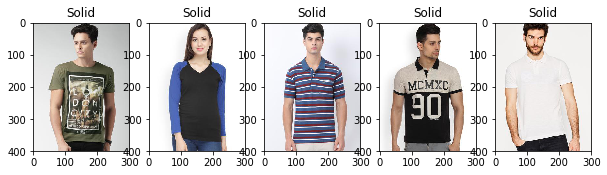

In [71]:
fig = plt.figure(figsize=(10,10))
for i in range(0,5):
    ax1 = fig.add_subplot(1,5,i+1)
    img = plt.imread(f'{PATH}test/{files[i]}')
    plt.title(data.classes[preds_test])
    plt.imshow(img);

In [51]:
from PIL import Image
import matplotlib.pyplot as plt
img = Image.open(f'{PATH}test)
img = plt.imread(data.test_dl.dataset.fnames[0].split('/')[1])
plt.show(img)

FileNotFoundError: [Errno 2] No such file or directory: 'zzz_5507_resized.jpg'

In [11]:
arch=resnet34
sz=192
bs=20
tfms = tfms_from_model(arch, sz)
data = ImageClassifierData.from_csv(PATH, 'train', f'{PATH}labels.csv', test_name='test', 
                                    val_idxs=val_idxs, num_workers=4, tfms=tfms, bs=bs)
learn = ConvLearner.pretrained(arch, data, precompute=True)
learn.fit(0.01, 2)

HBox(children=(IntProgress(value=0, description='Epoch', max=2), HTML(value='')))

epoch      trn_loss   val_loss   accuracy                      
    0      1.346312   1.221215   0.644858  
    1      1.297027   1.182899   0.65611                       



[1.1828992, 0.6561102811274869]

In [13]:
arch=resnet34
sz=224
bs=20
tfms = tfms_from_model(arch, sz, aug_tfms = transforms_side_on, max_zoom = 1.1)
data = ImageClassifierData.from_csv(PATH, 'train', f'{PATH}labels.csv', test_name='test', 
                                    val_idxs=val_idxs, num_workers=4, tfms=tfms, bs=bs)
learn = ConvLearner.pretrained(arch, data, precompute=True,ps=0.5)
learn.fit(0.01, 2)

HBox(children=(IntProgress(value=0, description='Epoch', max=2), HTML(value='')))

epoch      trn_loss   val_loss   accuracy                      
    0      1.3469     1.211609   0.648659  
    1      1.299298   1.162815   0.659463                      



[1.1628152, 0.6594634856112668]

In [26]:
arch=resnet34
sz=224
bs=20
tfms = tfms_from_model(arch, sz, aug_tfms = transforms_side_on, max_zoom = 1.1)
data = ImageClassifierData.from_csv(PATH, 'train', f'{PATH}labels.csv', test_name='test', 
                                    val_idxs=val_idxs, num_workers=4, tfms=tfms, bs=bs)
learn = ConvLearner.pretrained(arch, data, precompute=True)
learn.fit(0.01, 5)

HBox(children=(IntProgress(value=0, description='Epoch', max=5), HTML(value='')))

epoch      trn_loss   val_loss   accuracy                      
    0      1.319598   1.216272   0.645529  
    1      1.261817   1.160894   0.658569                      
    2      1.254555   1.144908   0.663934                      
    3      1.219957   1.122773   0.669076                      
    4      1.222002   1.113623   0.673709                      



[1.1136227, 0.6737091238048322]

In [14]:
learn.precompute = False
learn.fit(1e-2, 2)

HBox(children=(IntProgress(value=0, description='Epoch', max=2), HTML(value='')))

epoch      trn_loss   val_loss   accuracy                     
    0      1.35877    1.15205    0.662817  
    1      1.229037   1.141892   0.662742                     



[1.1418916, 0.6627421737128061]

In [172]:
learn.unfreeze()
lr=np.array([1e-4,1e-3,1e-2])
learn.fit(lr, 3, cycle_len=1, cycle_mult=2)

HBox(children=(IntProgress(value=0, description='Epoch', max=7), HTML(value='')))

epoch      trn_loss   val_loss   accuracy                   
    0      1.535359   1.308999   0.601093  
    1      2.296823   2.153238   0.337887                   
    2      2.197691   2.049959   0.374858                   
 45%|████▌     | 246/544 [01:26<01:44,  2.84it/s, loss=2.19]

KeyboardInterrupt: 

In [16]:
learn.save('Myntra_all_16epochs')

In [17]:
learn.load('Myntra_all_16epochs')

In [31]:
log_preds,y = learn.TTA()
probs = np.exp(log_preds)
accuracy(log_preds,y), metrics.log_loss(y,probs)

TypeError: torch.max received an invalid combination of arguments - got (numpy.ndarray, dim=int), but expected one of:
 * (torch.FloatTensor source)
 * (torch.FloatTensor source, torch.FloatTensor other)
      didn't match because some of the keywords were incorrect: dim
 * (torch.FloatTensor source, int dim)
 * (torch.FloatTensor source, int dim, bool keepdim)


In [18]:
log_preds = learn.predict()
preds = np.argmax(log_preds,axis=1)
print(preds)
probs = np.exp(log_preds[:,1])

[10 22  0 ... 22 22 22]


In [38]:
#log_preds,y = learn.TTA()
#preds = np.argmax(log_preds,axis=1)
#print(preds)
print(y)
probs = np.exp(log_preds)
accuracy(preds,y)

[ 0  0  0 ... 23 23 23]


TypeError: torch.max received an invalid combination of arguments - got (numpy.ndarray, dim=int), but expected one of:
 * (torch.FloatTensor source)
 * (torch.FloatTensor source, torch.FloatTensor other)
      didn't match because some of the keywords were incorrect: dim
 * (torch.FloatTensor source, int dim)
 * (torch.FloatTensor source, int dim, bool keepdim)


In [21]:
log_preds,y = learn.TTA(is_test=True)
probs = np.mean(np.exp(log_preds),0)
preds = np.argmax(log_preds,axis=1)
print(preds)

[[ 2686  4894  1121  2421 14216  9608  4432   924  1667  6562  6053  3226  1860  4366 14492  5307  6923
   1988  3181  8904  8504  6171  7920  8914]
 [ 2686 13954  1121  6130  7663  9608  4432   924  1667 12458  4405  8194  1860 10486 14492  7504 10456
  11739  3181  8904  8504  6171  9181  8914]
 [  978 13954   709  6130 10341  9608  4432   924  1667 12458  6053  3226  8000  4366  1950   282  2349
   1988  3181  6039 10815 12505  7920  1404]
 [  621 13954  6205 12754 14216  9608   132   924  8302  3706 10640  3019 10508 10486 14492 12602  7227
    212  9790 10601  3928 10155  4033  8914]
 [  621  7496  6912 12754 10341  9608   304 13828  1667   489 10959  4270  1860  4366  1950 12602  7227
   1988  3181 12131  8504  6171  9852  9342]]


In [23]:
y.shape

(14722, 1)

In [24]:
preds.shape

(5, 24)

How good is this model? Well, as we mentioned, prior to this competition, the state of the art was 80% accuracy. But the competition resulted in a huge jump to 98.9% accuracy, with the author of a popular deep learning library winning the competition. Extraordinarily, less than 4 years later, we can now beat that result in seconds! Even last year in this same course, our initial model had 98.3% accuracy, which is nearly double the error we're getting just a year later, and that took around 10 minutes to compute.

## Analyzing results: looking at pictures

As well as looking at the overall metrics, it's also a good idea to look at examples of each of:
1. A few correct labels at random
2. A few incorrect labels at random
3. The most correct labels of each class (ie those with highest probability that are correct)
4. The most incorrect labels of each class (ie those with highest probability that are incorrect)
5. The most uncertain labels (ie those with probability closest to 0.5).

In [25]:
# This is the label for a val data
data.val_y

array([ 0,  0,  0, ..., 23, 23, 23])

In [27]:
# from here we know that 'cats' is label 0 and 'dogs' is label 1.
data.classes

['Abstract',
 'Biker',
 'Camouflage',
 'Checked',
 'Colourblocked',
 'Conversational',
 'Floral',
 'Geometric',
 'Graphic',
 'HorizontalStripes',
 'HumourandComic',
 'Music',
 'PeopleandPlaces',
 'PolkaDots',
 'SelfDesign',
 'Solid',
 'Sports',
 'SportsandTeamJersey',
 'Striped',
 'Superhero',
 'TieandDye',
 'Tribal',
 'Typography',
 'Varsity']

In [42]:
# this gives prediction for validation set. Predictions are in log scale
log_preds = learn.predict()
log_preds.shape

(13417, 24)

In [25]:
log_preds[:10]

array([[0.06415, 0.00356, 0.00352, 0.00205, 0.02149, 0.0192 , 0.01567, 0.00582, 0.00416, 0.00949, 0.03181,
        0.01055, 0.30368, 0.00189, 0.02554, 0.00412, 0.00443, 0.02068, 0.04341, 0.00202, 0.00523, 0.16903,
        0.01398, 0.01556, 0.00231, 0.01657, 0.00453, 0.00489, 0.00287, 0.13976, 0.00665, 0.07152],
       [0.01479, 0.00191, 0.0024 , 0.00141, 0.00637, 0.00394, 0.01352, 0.00336, 0.0026 , 0.00355, 0.02603,
        0.02475, 0.04416, 0.00075, 0.00437, 0.00148, 0.00278, 0.00877, 0.00809, 0.00177, 0.00358, 0.38605,
        0.00509, 0.04934, 0.00052, 0.00155, 0.00082, 0.00324, 0.00186, 0.11006, 0.00284, 0.01925],
       [0.17035, 0.00809, 0.00565, 0.00278, 0.01093, 0.00719, 0.1121 , 0.00444, 0.00844, 0.0095 , 0.26913,
        0.04565, 0.17414, 0.0037 , 0.01041, 0.00668, 0.00324, 0.01628, 0.02155, 0.00534, 0.00684, 0.11068,
        0.01216, 0.00945, 0.00124, 0.01386, 0.00409, 0.00825, 0.00528, 0.04032, 0.00204, 0.07006],
       [0.05673, 0.01428, 0.00324, 0.00185, 0.00691, 0.02348,

In [43]:
preds = np.argmax(log_preds, axis=1)  # from log probabilities to 0 or 1
probs = np.exp(log_preds[:,1])        # pr(dog)

In [32]:
log_preds = learn.predict()
preds = np.argmax(log_preds,axis=1)
print(preds)
probs = np.exp(log_preds[:,1])

[10 22  0 ... 22 22 22]


In [33]:
def rand_by_mask(mask): return np.random.choice(np.where(mask)[0], 4, replace=False)
def rand_by_correct(is_correct): return rand_by_mask((preds == data.val_y)==is_correct)

def plot_val_with_title(idxs, title):
    imgs = np.stack([data.val_ds[x][0] for x in idxs])
    title_probs = [probs[x] for x in idxs]
    print(title)
    return plots(data.val_ds.denorm(imgs), rows=1, titles=title_probs)

def plots(ims, figsize=(12,6), rows=1, titles=None):
    f = plt.figure(figsize=figsize)
    for i in range(len(ims)):
        sp = f.add_subplot(rows, len(ims)//rows, i+1)
        sp.axis('Off')
        if titles is not None: sp.set_title(titles[i], fontsize=16)
        plt.imshow(ims[i])
        
def load_img_id(ds, idx): return np.array(PIL.Image.open(PATH+ds.fnames[idx]))

def plot_val_with_title(idxs, title):
    imgs = [load_img_id(data.val_ds,x) for x in idxs]
    title_probs = [probs[x] for x in idxs]
    print(title)
    return plots(imgs, rows=1, titles=title_probs, figsize=(16,8))

Correct Prediction


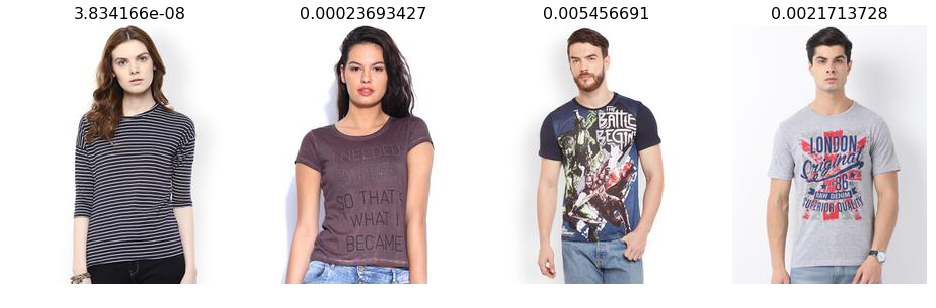

In [34]:
plot_val_with_title(rand_by_correct(True), "Correct Prediction")

Wrong Prediction


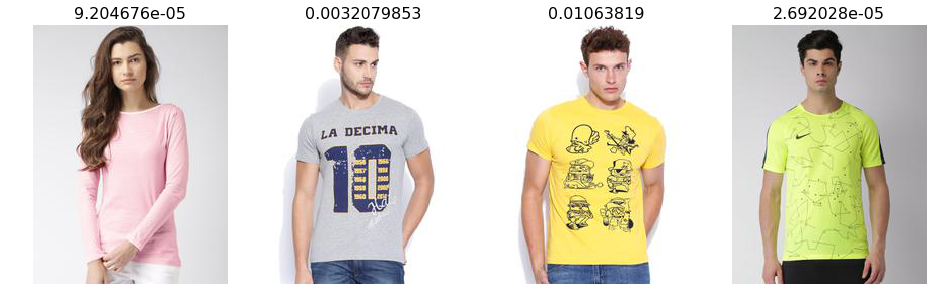

In [35]:
plot_val_with_title(rand_by_correct(False), "Wrong Prediction")

In [36]:
def most_by_mask(mask, mult):
    idxs = np.where(mask)[0]
    return idxs[np.argsort(mult * probs[idxs])[:4]]

def most_by_correct(y, is_correct): 
    mult = -1 if (y==1)==is_correct else 1
    return most_by_mask((preds == data.val_y)==is_correct & (data.val_y == y), mult)

Most correct Abstract


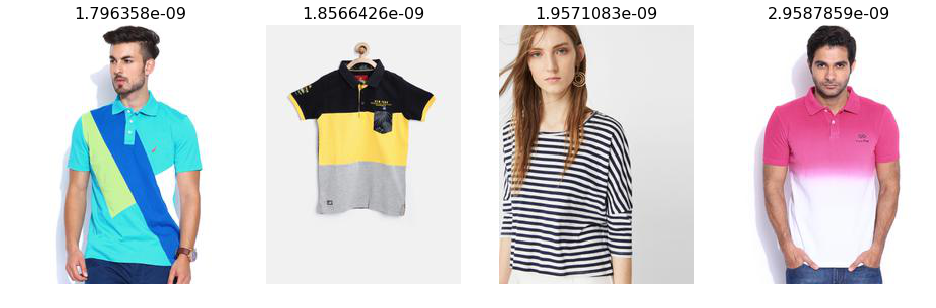

In [37]:
i = 0
plot_val_with_title(most_by_correct(i, True), "Most correct " + data.classes[i])

Most correct Biker


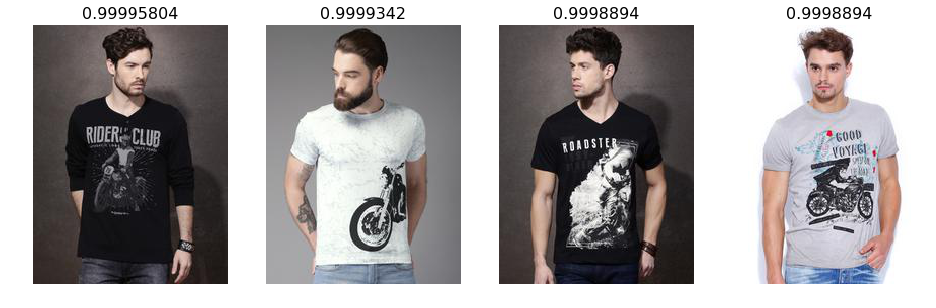

In [38]:
i = 1
plot_val_with_title(most_by_correct(i, True), "Most correct " + data.classes[i])

Most correct Camouflage


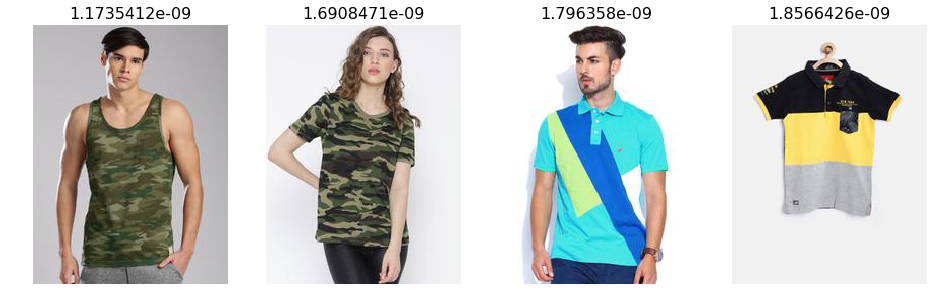

In [39]:
i = 2
plot_val_with_title(most_by_correct(i, True), "Most correct " + data.classes[i])

Most correct Checked


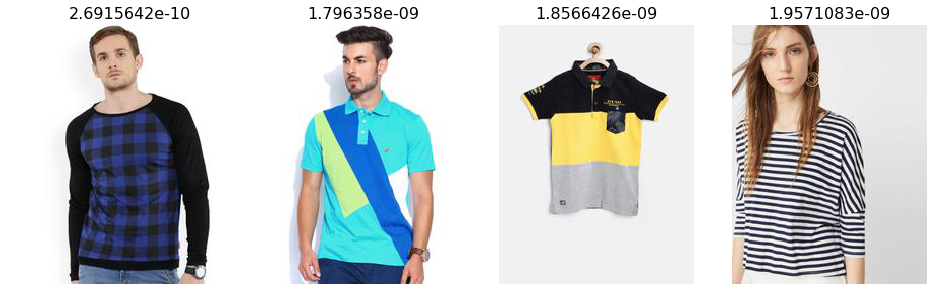

In [40]:
i = 3
plot_val_with_title(most_by_correct(i, True), "Most correct " + data.classes[i])

Most correct Colourblocked


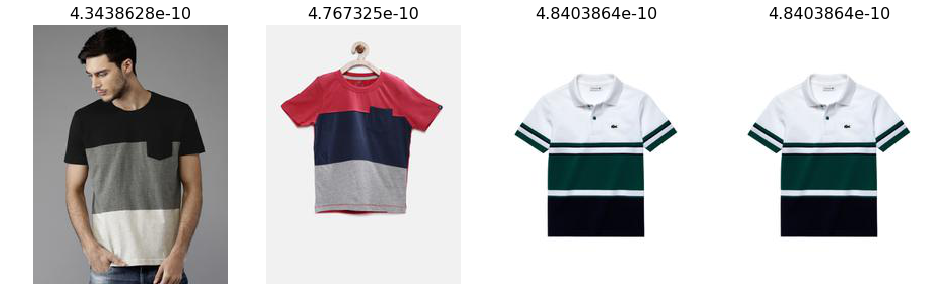

In [41]:
i = 4
plot_val_with_title(most_by_correct(i, True), "Most correct " + data.classes[i])

Most correct Conversational


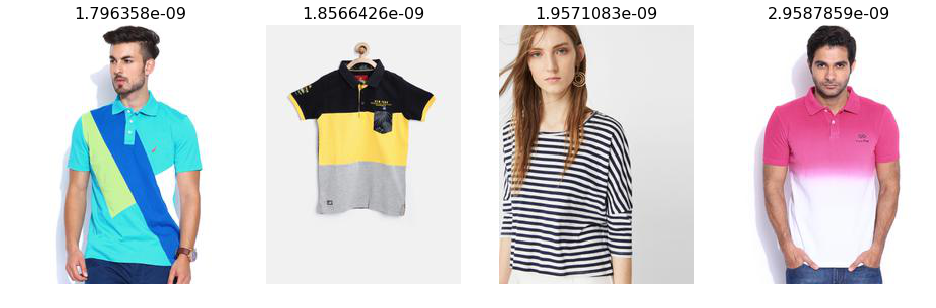

In [42]:
i = 5
plot_val_with_title(most_by_correct(i, True), "Most correct " + data.classes[i])

Most correct Floral


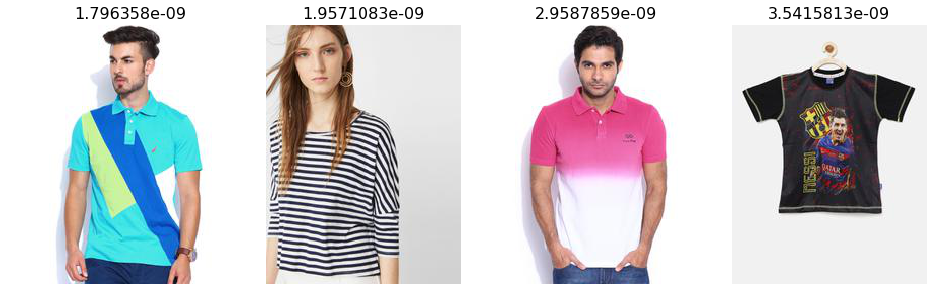

In [43]:
i = 6
plot_val_with_title(most_by_correct(i, True), "Most correct " + data.classes[i])

Most correct Geometric


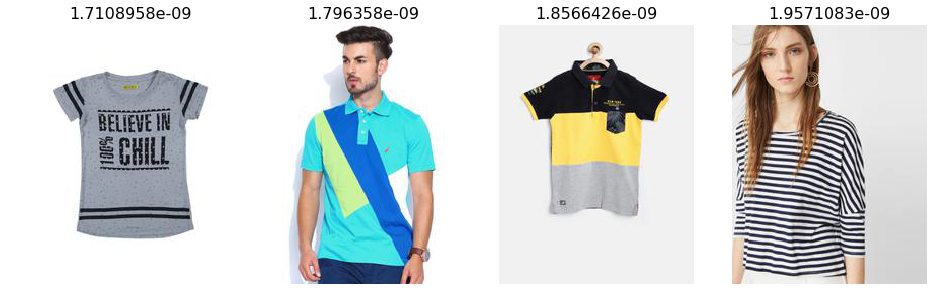

In [44]:
i = 7
plot_val_with_title(most_by_correct(i, True), "Most correct " + data.classes[i])

Most correct Graphic


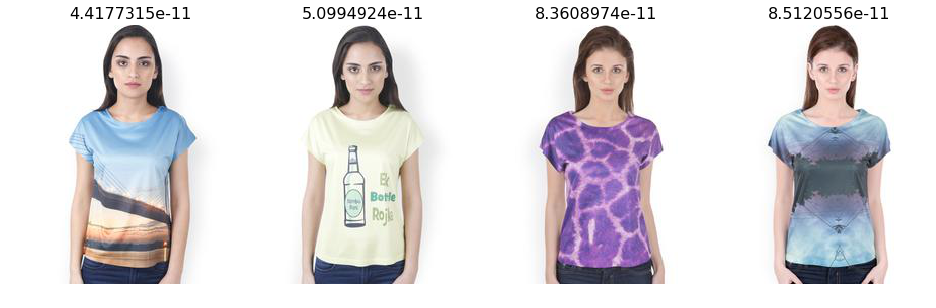

In [45]:
i = 8
plot_val_with_title(most_by_correct(i, True), "Most correct " + data.classes[i])

Most correct HorizontalStripes


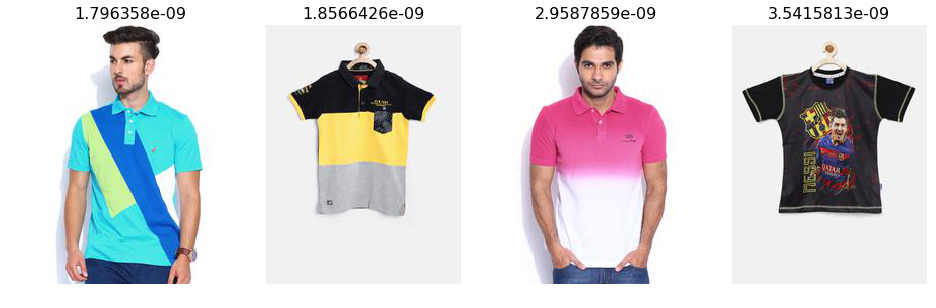

In [46]:
i = 9
plot_val_with_title(most_by_correct(i, True), "Most correct " + data.classes[i])

Most correct HumourandComic


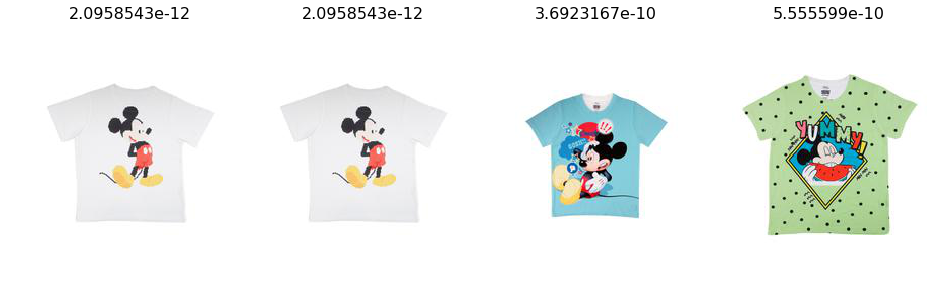

In [47]:
i = 10
plot_val_with_title(most_by_correct(i, True), "Most correct " + data.classes[i])

Most correct Music


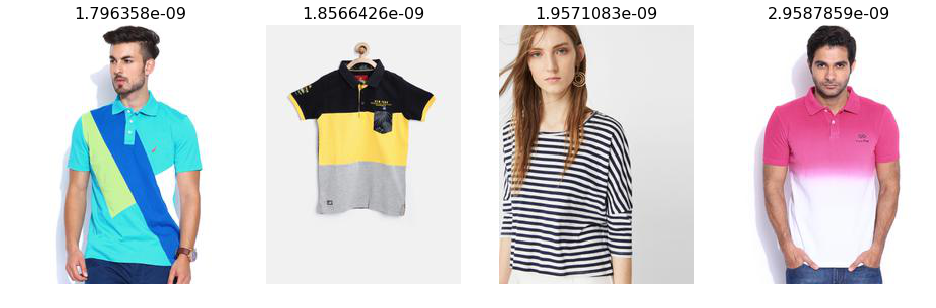

In [48]:
i = 11
plot_val_with_title(most_by_correct(i, True), "Most correct " + data.classes[i])

Most correct PeopleandPlaces


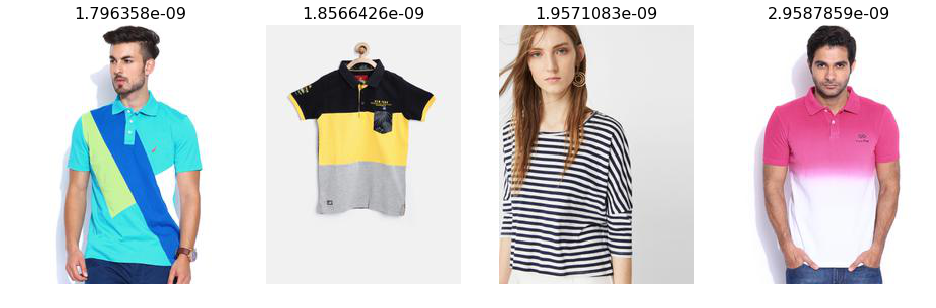

In [49]:
i = 12
plot_val_with_title(most_by_correct(i, True), "Most correct " + data.classes[i])

Most correct PolkaDots


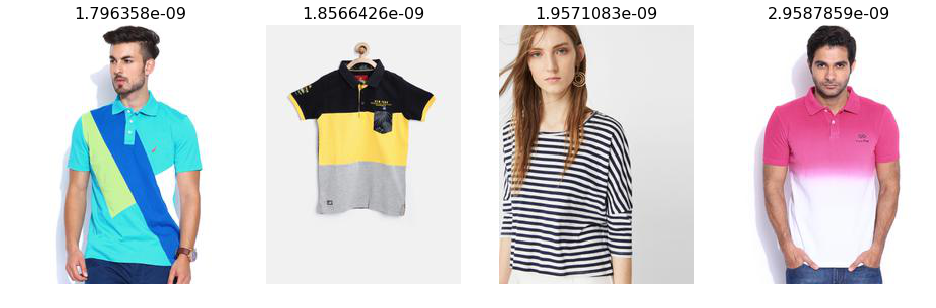

In [50]:
i = 13
plot_val_with_title(most_by_correct(i, True), "Most correct " + data.classes[i])

Most correct SelfDesign


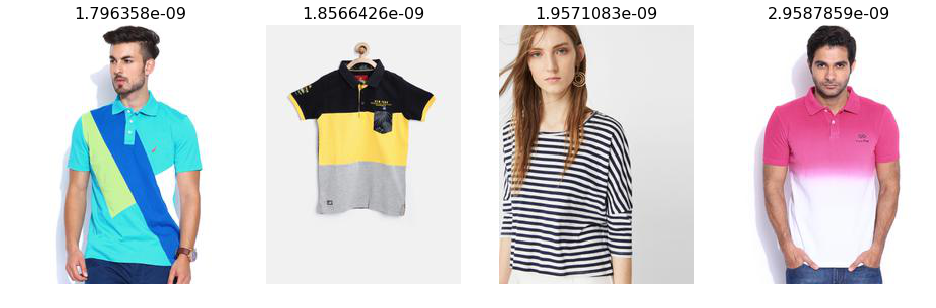

In [51]:
i = 14
plot_val_with_title(most_by_correct(i, True), "Most correct " + data.classes[i])

Most correct Solid


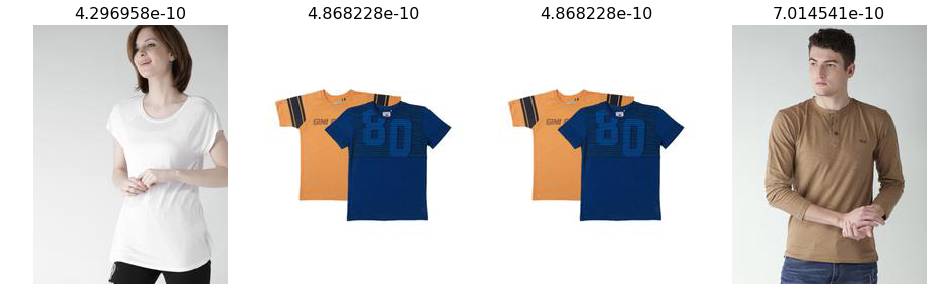

In [52]:
i = 15
plot_val_with_title(most_by_correct(i, True), "Most correct " + data.classes[i])

Most correct Sports


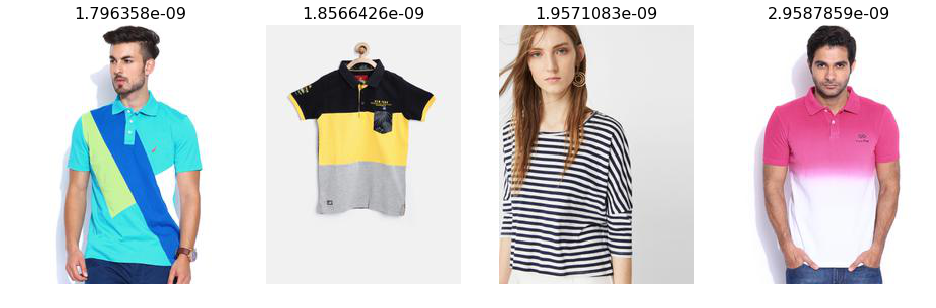

In [53]:
i = 16
plot_val_with_title(most_by_correct(i, True), "Most correct " + data.classes[i])

Most correct SportsandTeamJersey


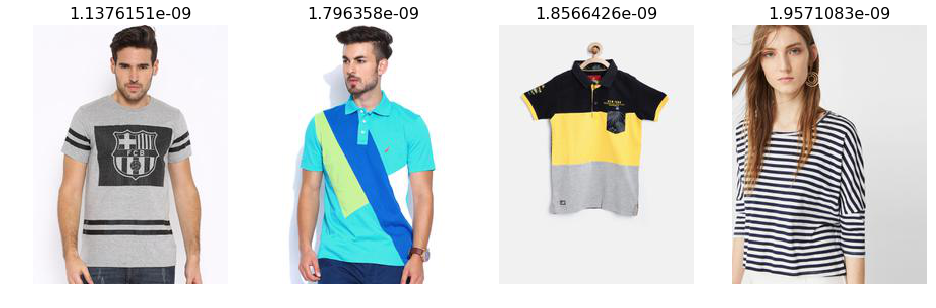

In [54]:
i = 17
plot_val_with_title(most_by_correct(i, True), "Most correct " + data.classes[i])

Most correct Striped


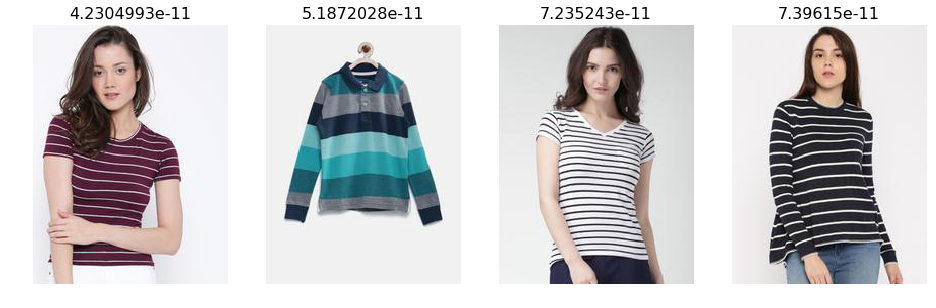

In [55]:
i = 18
plot_val_with_title(most_by_correct(i, True), "Most correct " + data.classes[i])

Most correct Superhero


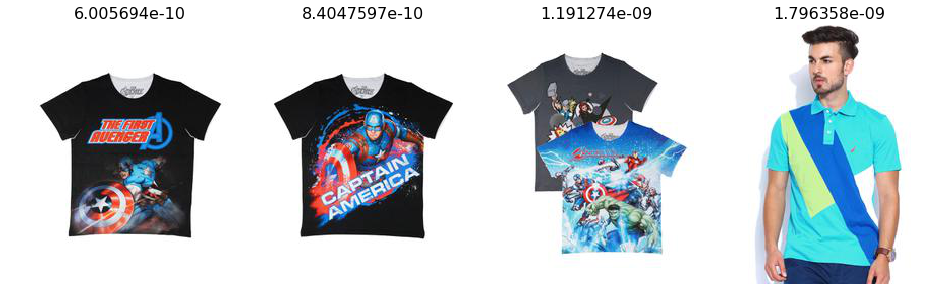

In [56]:
i = 19
plot_val_with_title(most_by_correct(i, True), "Most correct " + data.classes[i])

Most correct TieandDye


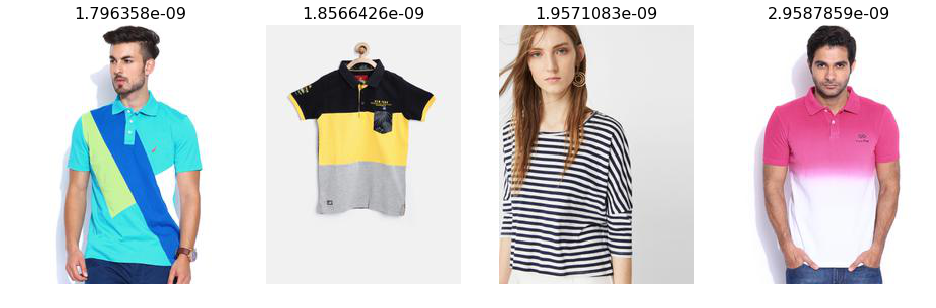

In [57]:
i = 20
plot_val_with_title(most_by_correct(i, True), "Most correct " + data.classes[i])

Most correct Tribal


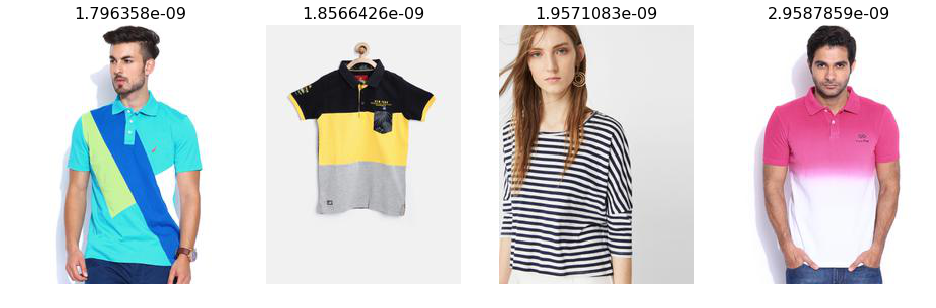

In [58]:
i = 21
plot_val_with_title(most_by_correct(i, True), "Most correct " + data.classes[i])

Most correct Typography


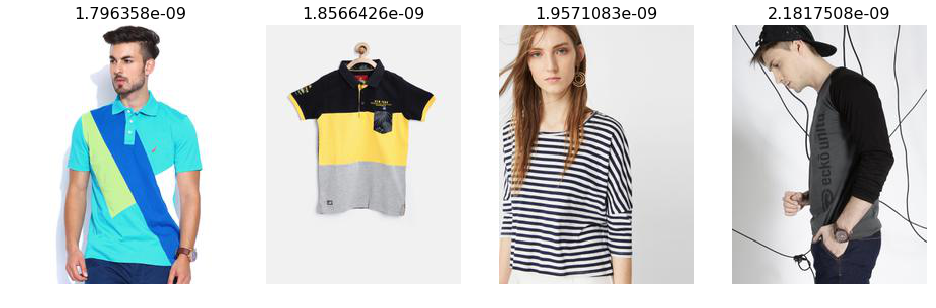

In [59]:
i = 22
plot_val_with_title(most_by_correct(i, True), "Most correct " + data.classes[i])

Most correct Varsity


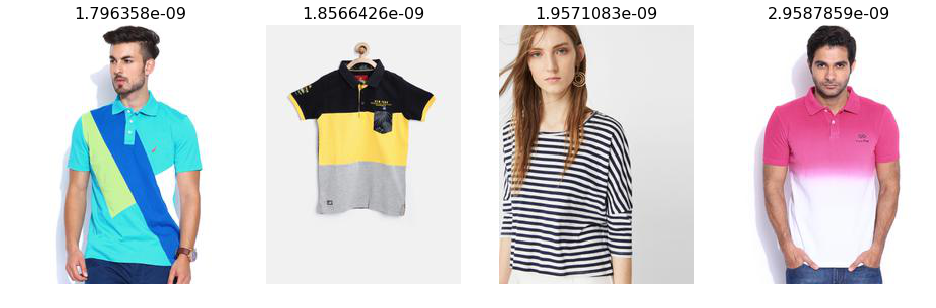

In [60]:
i = 23
plot_val_with_title(most_by_correct(i, True), "Most correct " + data.classes[i])

In [27]:
def rand_by_mask(mask): return np.random.choice(np.where(mask)[0], 4, replace=False)
def rand_by_correct(is_correct): return rand_by_mask((preds == data.val_y)==is_correct)

In [28]:
def plot_val_with_title(idxs, title):
    imgs = np.stack([data.val_ds[x][0] for x in idxs])
    title_probs = [probs[x] for x in idxs]
    print(title)
    return plots(data.val_ds.denorm(imgs), rows=1, titles=title_probs)

In [29]:
def plots(ims, figsize=(12,6), rows=1, titles=None):
    f = plt.figure(figsize=figsize)
    for i in range(len(ims)):
        sp = f.add_subplot(rows, len(ims)//rows, i+1)
        sp.axis('Off')
        if titles is not None: sp.set_title(titles[i], fontsize=16)
        plt.imshow(ims[i])

In [30]:
def load_img_id(ds, idx): return np.array(PIL.Image.open(PATH+ds.fnames[idx]))

def plot_val_with_title(idxs, title):
    imgs = [load_img_id(data.val_ds,x) for x in idxs]
    title_probs = [probs[x] for x in idxs]
    print(title)
    return plots(imgs, rows=1, titles=title_probs, figsize=(16,8))

In [31]:
# 1. A few correct labels at random
plot_val_with_title(rand_by_correct(True), "Correctly classified")

/home/paperspace/anaconda3/envs/fastai/lib/python3.6/site-packages/ipykernel_launcher.py:2: DeprecationWarning: elementwise == comparison failed; this will raise an error in the future.
  


ValueError: a must be non-empty

In [32]:
# 2. A few incorrect labels at random
plot_val_with_title(rand_by_correct(False), "Incorrectly classified")

/home/paperspace/anaconda3/envs/fastai/lib/python3.6/site-packages/ipykernel_launcher.py:2: DeprecationWarning: elementwise == comparison failed; this will raise an error in the future.
  


ValueError: Cannot take a larger sample than population when 'replace=False'

In [27]:
def most_by_mask(mask, mult):
    idxs = np.where(mask)[0]
    return idxs[np.argsort(mult * probs[idxs])[:4]]

def most_by_correct(y, is_correct): 
    mult = -1 if (y==1)==is_correct else 1
    return most_by_mask(((preds == data.val_y)==is_correct) & (data.val_y == y), mult)

Most correct cats


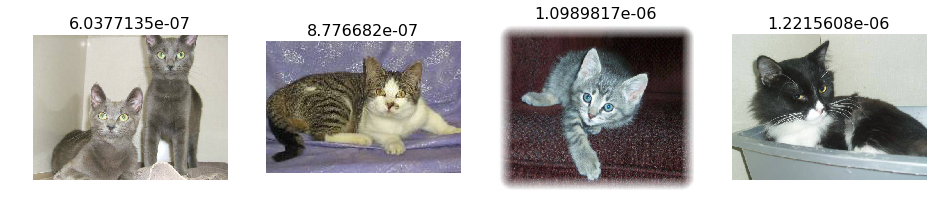

In [28]:
plot_val_with_title(most_by_correct(0, True), "Most correct cats")

Most correct dogs


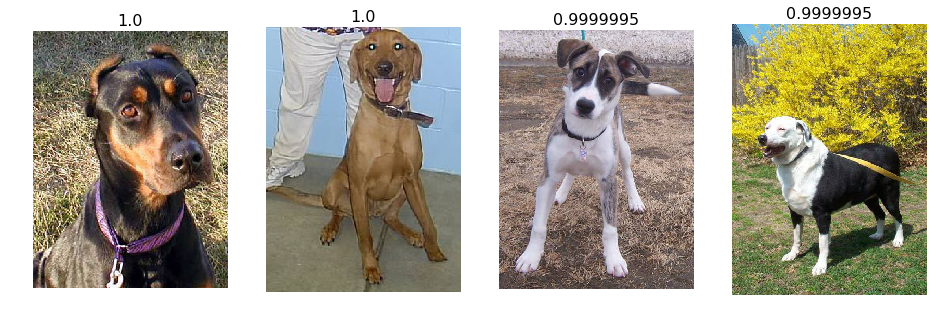

In [29]:
plot_val_with_title(most_by_correct(1, True), "Most correct dogs")

Most incorrect cats


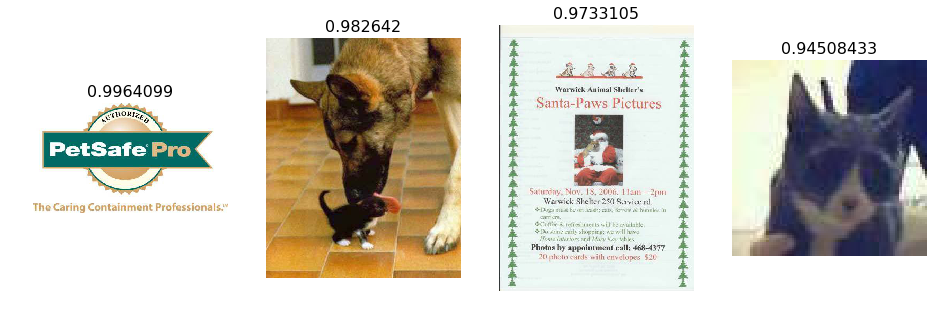

In [30]:
plot_val_with_title(most_by_correct(0, False), "Most incorrect cats")

Most incorrect dogs


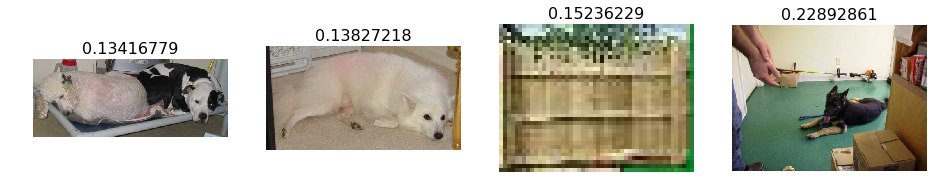

In [31]:
plot_val_with_title(most_by_correct(1, False), "Most incorrect dogs")

Most uncertain predictions


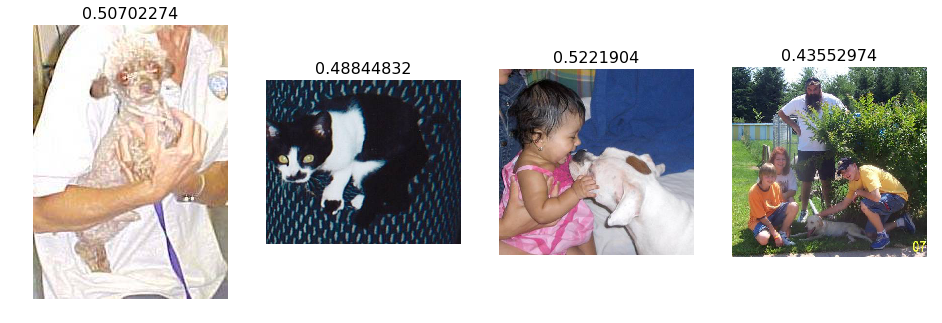

In [32]:
most_uncertain = np.argsort(np.abs(probs -0.5))[:4]
plot_val_with_title(most_uncertain, "Most uncertain predictions")

## Choosing a learning rate

The *learning rate* determines how quickly or how slowly you want to update the *weights* (or *parameters*). Learning rate is one of the most difficult parameters to set, because it significantly affect model performance.

The method `learn.lr_find()` helps you find an optimal learning rate. It uses the technique developed in the 2015 paper [Cyclical Learning Rates for Training Neural Networks](http://arxiv.org/abs/1506.01186), where we simply keep increasing the learning rate from a very small value, until the loss stops decreasing. We can plot the learning rate across batches to see what this looks like.

We first create a new learner, since we want to know how to set the learning rate for a new (untrained) model.

In [33]:
learn = ConvLearner.pretrained(arch, data, precompute=True)

In [34]:
lrf=learn.lr_find()

HBox(children=(IntProgress(value=0, description='Epoch', max=1), HTML(value='')))

 83%|████████▎ | 298/360 [00:05<00:01, 53.72it/s, loss=0.455]


Our `learn` object contains an attribute `sched` that contains our learning rate scheduler, and has some convenient plotting functionality including this one:

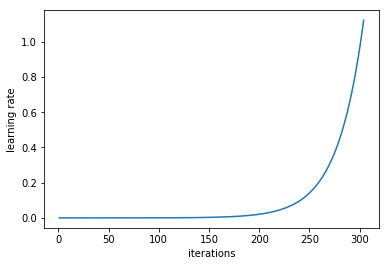

In [35]:
learn.sched.plot_lr()

Note that in the previous plot *iteration* is one iteration (or *minibatch*) of SGD. In one epoch there are 
(num_train_samples/num_iterations) of SGD.

We can see the plot of loss versus learning rate to see where our loss stops decreasing:

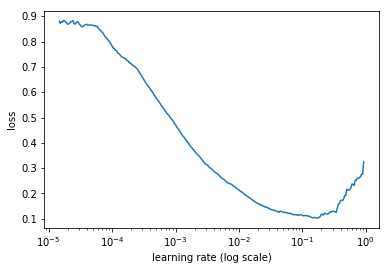

In [36]:
learn.sched.plot()

The loss is still clearly improving at lr=1e-2 (0.01), so that's what we use. Note that the optimal learning rate can change as we training the model, so you may want to re-run this function from time to time.

## Improving our model

### Data augmentation

If you try training for more epochs, you'll notice that we start to *overfit*, which means that our model is learning to recognize the specific images in the training set, rather than generalizing such that we also get good results on the validation set. One way to fix this is to effectively create more data, through *data augmentation*. This refers to randomly changing the images in ways that shouldn't impact their interpretation, such as horizontal flipping, zooming, and rotating.

We can do this by passing `aug_tfms` (*augmentation transforms*) to `tfms_from_model`, with a list of functions to apply that randomly change the image however we wish. For photos that are largely taken from the side (e.g. most photos of dogs and cats, as opposed to photos taken from the top down, such as satellite imagery) we can use the pre-defined list of functions `transforms_side_on`. We can also specify random zooming of images up to specified scale by adding the `max_zoom` parameter.

In [37]:
tfms = tfms_from_model(resnet34, sz, aug_tfms=transforms_side_on, max_zoom=1.1)

In [38]:
def get_augs():
    data = ImageClassifierData.from_paths(PATH, bs=2, tfms=tfms, num_workers=1)
    x,_ = next(iter(data.aug_dl))
    return data.trn_ds.denorm(x)[1]

In [39]:
ims = np.stack([get_augs() for i in range(6)])

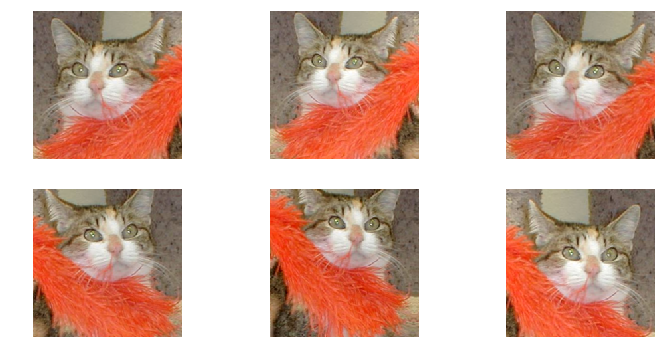

In [40]:
plots(ims, rows=2)

Let's create a new `data` object that includes this augmentation in the transforms.

In [41]:
data = ImageClassifierData.from_paths(PATH, tfms=tfms)
learn = ConvLearner.pretrained(arch, data, precompute=True)

In [42]:
learn.fit(1e-2, 1)

HBox(children=(IntProgress(value=0, description='Epoch', max=1), HTML(value='')))

epoch      trn_loss   val_loss   accuracy                     
    0      0.059983   0.03791    0.989746  



[0.037909772, 0.98974609375]

In [43]:
learn.precompute=False

By default when we create a learner, it sets all but the last layer to *frozen*. That means that it's still only updating the weights in the last layer when we call `fit`.

In [44]:
learn.fit(1e-2, 3, cycle_len=1)

HBox(children=(IntProgress(value=0, description='Epoch', max=3), HTML(value='')))

epoch      trn_loss   val_loss   accuracy                     
    0      0.036379   0.028121   0.990234  
    1      0.047972   0.028183   0.990234                     
    2      0.041483   0.028588   0.990723                     



[0.028588042, 0.99072265625]

What is that `cycle_len` parameter? What we've done here is used a technique called *stochastic gradient descent with restarts (SGDR)*, a variant of *learning rate annealing*, which gradually decreases the learning rate as training progresses. This is helpful because as we get closer to the optimal weights, we want to take smaller steps.

However, we may find ourselves in a part of the weight space that isn't very resilient - that is, small changes to the weights may result in big changes to the loss. We want to encourage our model to find parts of the weight space that are both accurate and stable. Therefore, from time to time we increase the learning rate (this is the 'restarts' in 'SGDR'), which will force the model to jump to a different part of the weight space if the current area is "spikey". Here's a picture of how that might look if we reset the learning rates 3 times (in this paper they call it a "cyclic LR schedule"):

<img src="images/sgdr.png" width="80%">
(From the paper [Snapshot Ensembles](https://arxiv.org/abs/1704.00109)).

The number of epochs between resetting the learning rate is set by `cycle_len`, and the number of times this happens is refered to as the *number of cycles*, and is what we're actually passing as the 2nd parameter to `fit()`. So here's what our actual learning rates looked like:

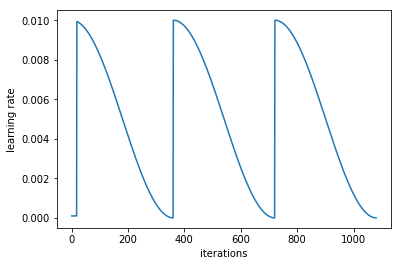

In [45]:
learn.sched.plot_lr()

Our validation loss isn't improving much, so there's probably no point further training the last layer on its own.

Since we've got a pretty good model at this point, we might want to save it so we can load it again later without training it from scratch.

In [46]:
learn.save('224_lastlayer')

In [47]:
learn.load('224_lastlayer')

### Fine-tuning and differential learning rate annealing

Now that we have a good final layer trained, we can try fine-tuning the other layers. To tell the learner that we want to unfreeze the remaining layers, just call (surprise surprise!) `unfreeze()`.

In [48]:
learn.unfreeze()

Note that the other layers have *already* been trained to recognize imagenet photos (whereas our final layers where randomly initialized), so we want to be careful of not destroying the carefully tuned weights that are already there.

Generally speaking, the earlier layers (as we've seen) have more general-purpose features. Therefore we would expect them to need less fine-tuning for new datasets. For this reason we will use different learning rates for different layers: the first few layers will be at 1e-4, the middle layers at 1e-3, and our FC layers we'll leave at 1e-2 as before. We refer to this as *differential learning rates*, although there's no standard name for this techique in the literature that we're aware of.

In [49]:
lr=np.array([1e-4,1e-3,1e-2])

In [50]:
learn.fit(lr, 3, cycle_len=1, cycle_mult=2)

HBox(children=(IntProgress(value=0, description='Epoch', max=7), HTML(value='')))

epoch      trn_loss   val_loss   accuracy                     
    0      0.05738    0.028526   0.990234  
    1      0.041183   0.022314   0.991211                     
    2      0.029082   0.021976   0.991699                     
    3      0.027244   0.021512   0.992676                     
    4      0.032768   0.021343   0.993164                     
    5      0.024609   0.020913   0.992188                     
    6      0.016736   0.020517   0.992188                     



[0.02051742, 0.9921875]

Another trick we've used here is adding the `cycle_mult` parameter. Take a look at the following chart, and see if you can figure out what the parameter is doing:

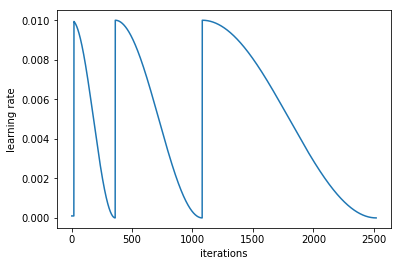

In [51]:
learn.sched.plot_lr()

Note that's what being plotted above is the learning rate of the *final layers*. The learning rates of the earlier layers are fixed at the same multiples of the final layer rates as we initially requested (i.e. the first layers have 100x smaller, and middle layers 10x smaller learning rates, since we set `lr=np.array([1e-4,1e-3,1e-2])`.

In [52]:
learn.save('224_all')

In [53]:
learn.load('224_all')

There is something else we can do with data augmentation: use it at *inference* time (also known as *test* time). Not surprisingly, this is known as *test time augmentation*, or just *TTA*.

TTA simply makes predictions not just on the images in your validation set, but also makes predictions on a number of randomly augmented versions of them too (by default, it uses the original image along with 4 randomly augmented versions). It then takes the average prediction from these images, and uses that. To use TTA on the validation set, we can use the learner's `TTA()` method.

In [54]:
log_preds,y = learn.TTA()
probs = np.mean(np.exp(log_preds),0)

In [55]:
accuracy_np(probs, y)

0.994

I generally see about a 10-20% reduction in error on this dataset when using TTA at this point, which is an amazing result for such a quick and easy technique!

## Analyzing results

### Confusion matrix 

In [56]:
preds = np.argmax(probs, axis=1)
probs = probs[:,1]

A common way to analyze the result of a classification model is to use a [confusion matrix](http://www.dataschool.io/simple-guide-to-confusion-matrix-terminology/). Scikit-learn has a convenient function we can use for this purpose:

In [57]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y, preds)

We can just print out the confusion matrix, or we can show a graphical view (which is mainly useful for dependents with a larger number of categories).

[[993   7]
 [  5 995]]


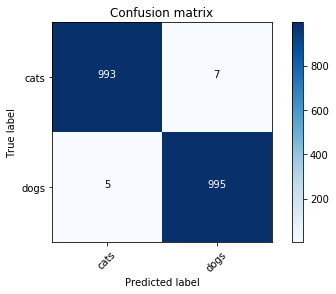

In [58]:
plot_confusion_matrix(cm, data.classes)

### Looking at pictures again

Most incorrect cats


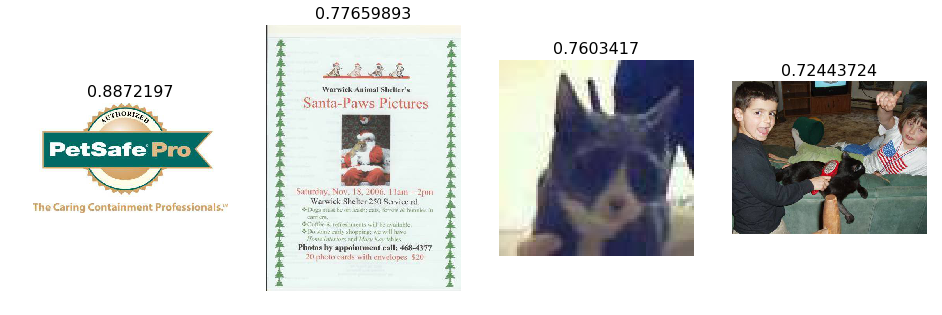

In [59]:
plot_val_with_title(most_by_correct(0, False), "Most incorrect cats")

Most incorrect dogs


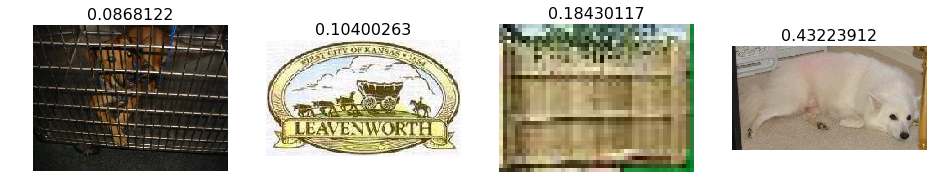

In [60]:
plot_val_with_title(most_by_correct(1, False), "Most incorrect dogs")

## Review: easy steps to train a world-class image classifier

1. Enable data augmentation, and precompute=True
1. Use `lr_find()` to find highest learning rate where loss is still clearly improving
1. Train last layer from precomputed activations for 1-2 epochs
1. Train last layer with data augmentation (i.e. precompute=False) for 2-3 epochs with cycle_len=1
1. Unfreeze all layers
1. Set earlier layers to 3x-10x lower learning rate than next higher layer
1. Use `lr_find()` again
1. Train full network with cycle_mult=2 until over-fitting

## Understanding the code for our first model

Let's look at the Dogs v Cats code line by line.

**tfms** stands for *transformations*. `tfms_from_model` takes care of resizing, image cropping, initial normalization (creating data with (mean,stdev) of (0,1)), and more.

In [61]:
tfms = tfms_from_model(resnet34, sz)

We need a <b>path</b> that points to the dataset. In this path we will also store temporary data and final results. `ImageClassifierData.from_paths` reads data from a provided path and creates a dataset ready for training.

In [62]:
data = ImageClassifierData.from_paths(PATH, tfms=tfms)

`ConvLearner.pretrained` builds *learner* that contains a pre-trained model. The last layer of the model needs to be replaced with the layer of the right dimensions. The pretained model was trained for 1000 classes therfore the final layer predicts a vector of 1000 probabilities. The model for cats and dogs needs to output a two dimensional vector. The diagram below shows in an example how this was done in one of the earliest successful CNNs. The layer "FC8" here would get replaced with a new layer with 2 outputs.

<img src="images/pretrained.png" width="500">
[original image](https://image.slidesharecdn.com/practicaldeeplearning-160329181459/95/practical-deep-learning-16-638.jpg)

In [63]:
learn = ConvLearner.pretrained(resnet34, data, precompute=True)

*Parameters*  are learned by fitting a model to the data. *Hyparameters* are another kind of parameter, that cannot be directly learned from the regular training process. These parameters express “higher-level” properties of the model such as its complexity or how fast it should learn. Two examples of hyperparameters are the *learning rate* and the *number of epochs*.

During iterative training of a neural network, a *batch* or *mini-batch* is a subset of training samples used in one iteration of Stochastic Gradient Descent (SGD). An *epoch* is a single pass through the entire training set which consists of multiple iterations of SGD.

We can now *fit* the model; that is, use *gradient descent* to find the best parameters for the fully connected layer we added, that can separate cat pictures from dog pictures. We need to pass two hyperameters: the *learning rate* (generally 1e-2 or 1e-3 is a good starting point, we'll look more at this next) and the *number of epochs* (you can pass in a higher number and just stop training when you see it's no longer improving, then re-run it with the number of epochs you found works well.)

In [64]:
learn.fit(1e-2, 1)

HBox(children=(IntProgress(value=0, description='Epoch', max=1), HTML(value='')))

epoch      trn_loss   val_loss   accuracy                     
    0      0.048176   0.024436   0.990234  



[0.024436401, 0.990234375]

## Analyzing results: loss and accuracy

When we run `learn.fit` we print 3 performance values (see above.) Here 0.03 is the value of the **loss** in the training set, 0.0226 is the value of the loss in the validation set and 0.9927 is the validation accuracy. What is the loss? What is accuracy? Why not to just show accuracy?

**Accuracy** is the ratio of correct prediction to the total number of predictions.

In machine learning the **loss** function or cost function is representing the price paid for inaccuracy of predictions.

The loss associated with one example in binary classification is given by:
`-(y * log(p) + (1-y) * log (1-p))`
where `y` is the true label of `x` and `p` is the probability predicted by our model that the label is 1.

In [65]:
def binary_loss(y, p):
    return np.mean(-(y * np.log(p) + (1-y)*np.log(1-p)))

In [66]:
acts = np.array([1, 0, 0, 1])
preds = np.array([0.9, 0.1, 0.2, 0.8])
binary_loss(acts, preds)

0.164252033486018

Note that in our toy example above our accuracy is 100% and our loss is 0.16. Compare that to a loss of 0.03 that we are getting while predicting cats and dogs. Exercise: play with `preds` to get a lower loss for this example. 

**Example:** Here is an example on how to compute the loss for one example of binary classification problem. Suppose for an image x with label 1 and your model gives it a prediction of 0.9. For this case the loss should be small because our model is predicting a label $1$ with high probability.

`loss = -log(0.9) = 0.10`

Now suppose x has label 0 but our model is predicting 0.9. In this case our loss should be much larger.

loss = -log(1-0.9) = 2.30

- Exercise: look at the other cases and convince yourself that this make sense.
- Exercise: how would you rewrite `binary_loss` using `if` instead of `*` and `+`?

Why not just maximize accuracy? The binary classification loss is an easier function to optimize.